### Initial import of dependencies 
###### Some data cleaning and creating dataframes from grouping the base data frame generated from the first pd.read_csv() line

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
import datetime
import matplotlib.dates as mdates

full_data = pd.read_csv(r'data\all_breakdown.csv')
full_data['SOLAR'] = full_data['SOLAR'].fillna(0)
full_data['SOLAR PV'] = full_data['SOLAR PV'].fillna(0)
full_data['SOLAR THERMAL'] = full_data['SOLAR THERMAL'].fillna(0)
full_data['SOLAR TOTAL'] = full_data['SOLAR']+full_data['SOLAR PV']+full_data['SOLAR THERMAL']
full_data['TIMESTAMP'] = pd.to_datetime(full_data['TIMESTAMP'])
full_data['TIMESTAMP'] = pd.to_datetime(full_data['TIMESTAMP'])
full_data['MONTH'] = full_data['TIMESTAMP'].dt.month
full_data['YEAR'] = full_data['TIMESTAMP'].dt.year
full_data['DAY'] = full_data['TIMESTAMP'].dt.day
full_data['WIND SOLAR'] = full_data['SOLAR TOTAL'] + full_data['WIND TOTAL']
full_data['RENEW TOTAL'] = full_data['BIOGAS'] + full_data['BIOMASS']+ full_data['GEOTHERMAL']+full_data['GEOTHERMAL']+full_data['WIND SOLAR']
full_data['Hour'] = full_data['Hour'].astype(int)
full_data['COMBINED SMALLER SOURCES'] = full_data['RENEW TOTAL'] - full_data['WIND SOLAR']
#full_data['RENEW TOTAL'] = full_data['RENEW TOTAL'].apply(lambda x : "{:,}".format(x))


YearMonthGrouped = full_data.groupby(['YEAR','MONTH'])
monthly_sum = pd.DataFrame(YearMonthGrouped['RENEW TOTAL'].sum())
monthly_sum['Renew Total'] = monthly_sum['RENEW TOTAL']
monthly_sum.drop(columns=['RENEW TOTAL'], inplace=True)
monthly_sum['Solar Total'] = YearMonthGrouped['SOLAR TOTAL'].sum()
monthly_sum['Wind Total'] = YearMonthGrouped['WIND TOTAL'].sum()
monthly_sum['Wind Solar Total'] = YearMonthGrouped['WIND SOLAR'].sum()

hour_grouped = full_data.groupby('Hour')
hour_sum = pd.DataFrame(hour_grouped['SOLAR'].mean())
#hour_sum['Solar'] = hour_sum['SOLAR']
hour_sum.drop(columns=['SOLAR'], inplace=True)
hour_sum['Wind Total'] = hour_grouped['WIND TOTAL'].mean()
hour_sum['Biogas'] = hour_grouped['BIOGAS'].mean()
hour_sum['Geothermal'] = hour_grouped['GEOTHERMAL'].mean()
hour_sum['Solar PV'] = hour_grouped['SOLAR PV'].mean()
hour_sum['Solar Total'] = hour_grouped['SOLAR TOTAL'].mean()
hour_sum['Solar Thermal'] = hour_grouped['SOLAR THERMAL'].mean()
hour_sum['Small Hydro'] = hour_grouped['SMALL HYDRO'].mean()
hour_sum['Biomass'] = hour_grouped['BIOMASS'].mean()
hour_sum['Renew Total'] = hour_grouped['RENEW TOTAL'].mean()
hour_sum['Combined Smaller Sources'] = hour_grouped['COMBINED SMALLER SOURCES'].mean()

display(full_data.head())
display(monthly_sum.head())
display(hour_sum.head())
print(full_data.info())

,TIMESTAMP,BIOGAS,BIOMASS,GEOTHERMAL,Hour,SMALL HYDRO,SOLAR,SOLAR PV,SOLAR THERMAL,WIND TOTAL,SOLAR TOTAL,MONTH,YEAR,DAY,WIND SOLAR,RENEW TOTAL,COMBINED SMALLER SOURCES
0,2011-07-21 00:00:00,177.0,372.0,984.0,1,516.0,0.0,0.0,0.0,1607.0,0.0,7,2011,21,1607.0,4124.0,2517.0
1,2011-07-21 01:00:00,176.0,373.0,984.0,2,509.0,0.0,0.0,0.0,1619.0,0.0,7,2011,21,1619.0,4136.0,2517.0
2,2011-07-21 02:00:00,177.0,371.0,985.0,3,506.0,0.0,0.0,0.0,1660.0,0.0,7,2011,21,1660.0,4178.0,2518.0
3,2011-07-21 03:00:00,177.0,374.0,985.0,4,504.0,0.0,0.0,0.0,1633.0,0.0,7,2011,21,1633.0,4154.0,2521.0
4,2011-07-21 04:00:00,177.0,377.0,984.0,5,508.0,0.0,0.0,0.0,1520.0,0.0,7,2011,21,1520.0,4042.0,2522.0


Renew Total  Solar Total  Wind Total  Wind Solar Total
YEAR MONTH                                                        
2010 4         911869.0      27307.0    208245.0          235552.0
     5        2610401.0     101640.0    665327.0          766967.0
     6        2806834.0     131065.0    805400.0          936465.0
     7        2912108.0     130052.0    842461.0          972513.0
     8        2665302.0     118890.0    680201.0          799091.0

,Wind Total,Biogas,Geothermal,Solar PV,Solar Total,Solar Thermal,Small Hydro,Biomass,Renew Total,Combined Smaller Sources
Hour,,,,,,,,,,
1,1521.266220,179.651798,963.327744,0.029119,0.350497,0.055043,283.995980,298.051838,3925.975842,2404.359125
2,1530.472853,179.699850,962.971254,0.029119,0.282315,0.051136,274.658983,296.817526,3933.215053,2402.459885
3,1478.404808,179.891453,962.771047,0.025213,0.204190,0.013849,267.809934,297.830169,3881.872713,2403.263715
4,1409.330734,180.122185,962.975865,0.021307,0.167259,0.006037,266.499948,299.219628,3814.791535,2405.293543
5,1338.311521,180.040767,962.791031,0.406250,0.535156,0.008168,271.807781,300.312655,3744.782162,2405.935484


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67584 entries, 0 to 67583
Data columns (total 17 columns):
TIMESTAMP                   67584 non-null datetime64[ns]
BIOGAS                      67584 non-null float64
BIOMASS                     67584 non-null float64
GEOTHERMAL                  67584 non-null float64
Hour                        67584 non-null int32
SMALL HYDRO                 67584 non-null float64
SOLAR                       67584 non-null float64
SOLAR PV                    67584 non-null float64
SOLAR THERMAL               67584 non-null float64
WIND TOTAL                  67584 non-null float64
SOLAR TOTAL                 67584 non-null float64
MONTH                       67584 non-null int64
YEAR                        67584 non-null int64
DAY                         67584 non-null int64
WIND SOLAR                  67584 non-null float64
RENEW TOTAL                 67584 non-null float64
COMBINED SMALLER SOURCES    67584 non-null float64
dtypes: datetime64[ns](1)

## Plotting average renewable production across the hours in a day 
###### Box plots are for all the data across all the years (2010-2018) to show the general trend in production across a day and the variance in production for a given hour of a day across all the years


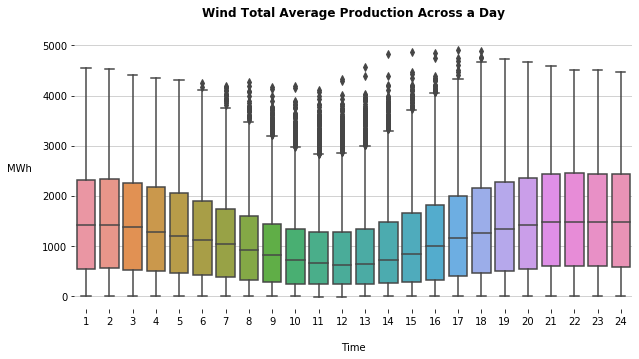

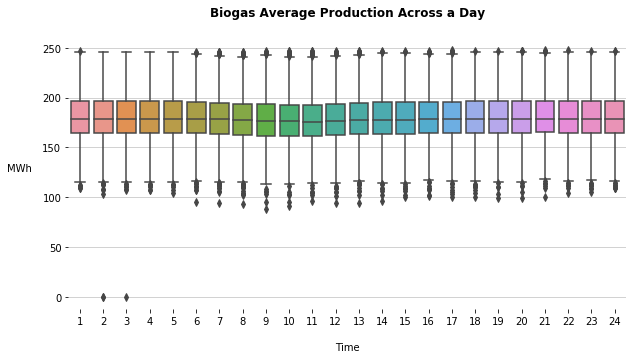

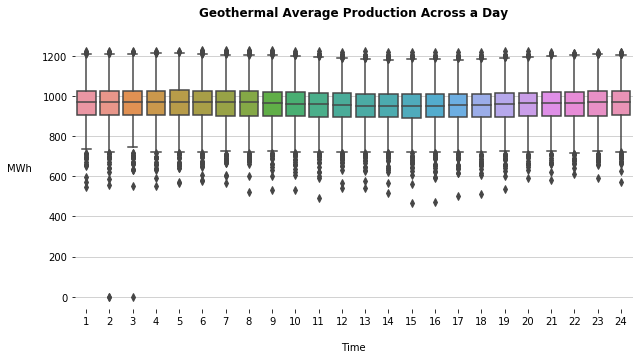

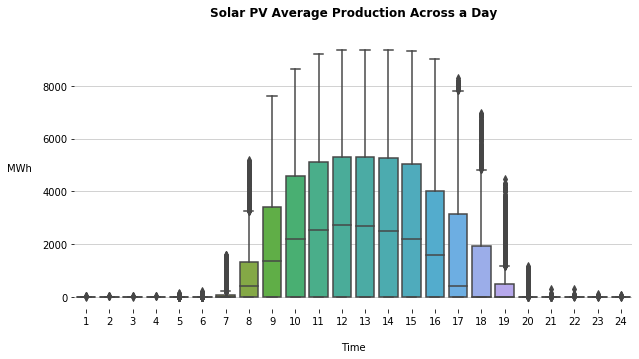

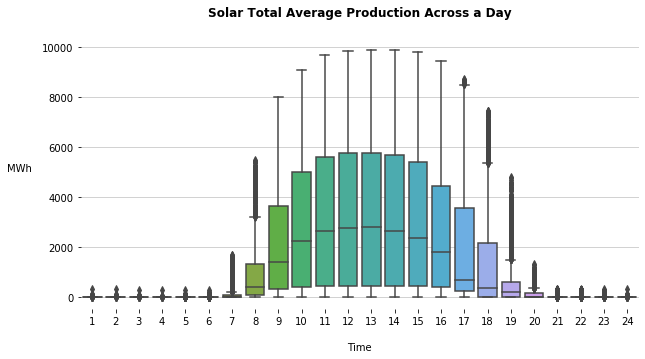

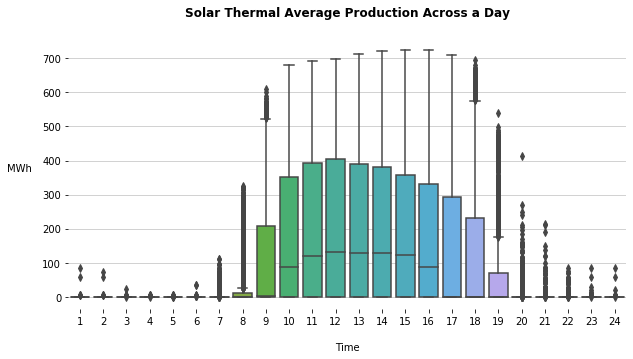

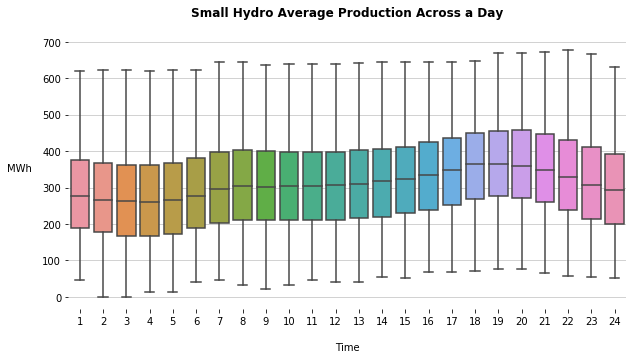

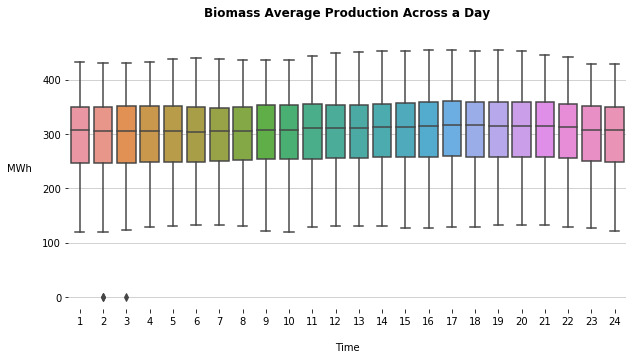

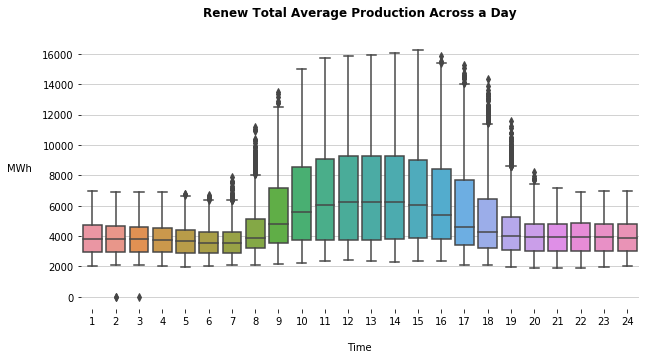

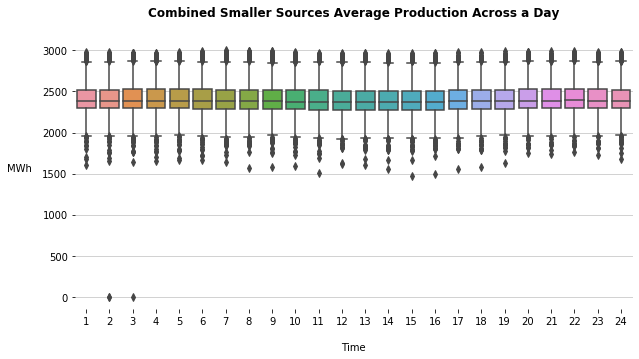

In [2]:
for i in range(len(hour_sum.columns)):
    plt.figure(figsize=(10,5))
    sns.boxplot(full_data['Hour'],full_data[hour_sum.columns[i].upper()])
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['left'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['bottom'].set_visible(False)
    plt.gca().set_axisbelow(True)
    plt.gca().grid(axis='y',alpha=.7)

    plt.title('{} Average Production Across a Day\n'.format(hour_sum.columns[i]),fontweight='bold')

    plt.xlabel('\nTime')

    plt.ylabel("MWh  ",rotation='0',ha='right')
    #plt.savefig('Charts/Box Plots Daily Production/{}_average_daily_production.png'.format(hour_sum.columns[i]),bbox_inches = "tight")

plt.show()

## Plotting solar power production for all full years in Kaggle data set (2011-2017).
###### Split into thirds of a day to show the fluctuation in daily production across the given year.  Vertical lines show soltice and equinox days to show how seasonality effects overall production (general height of all the dots) as well as how seasonality effects solar production across the hours in a day.

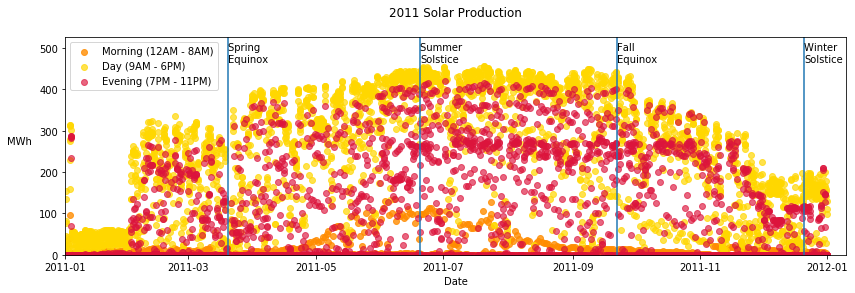

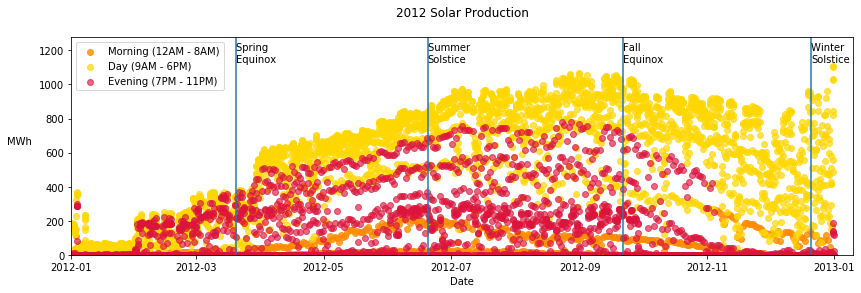

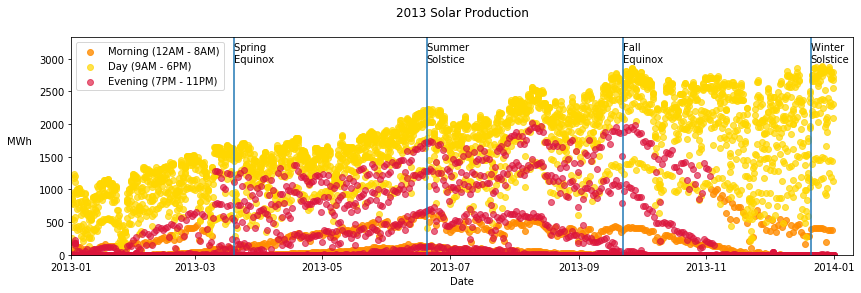

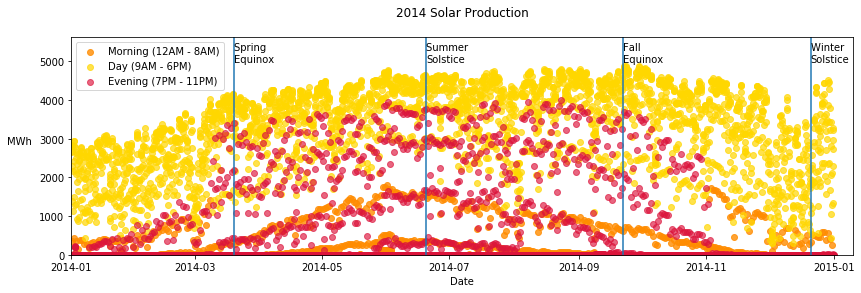

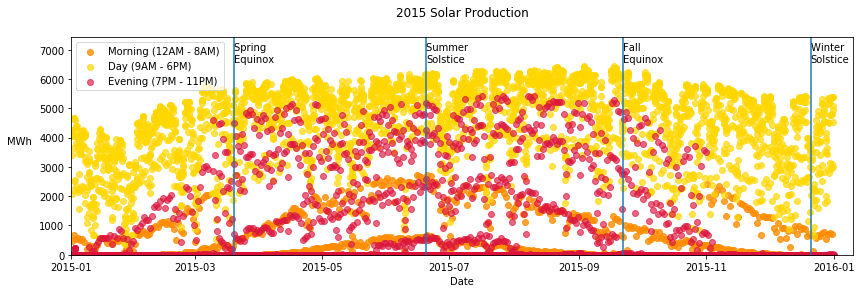

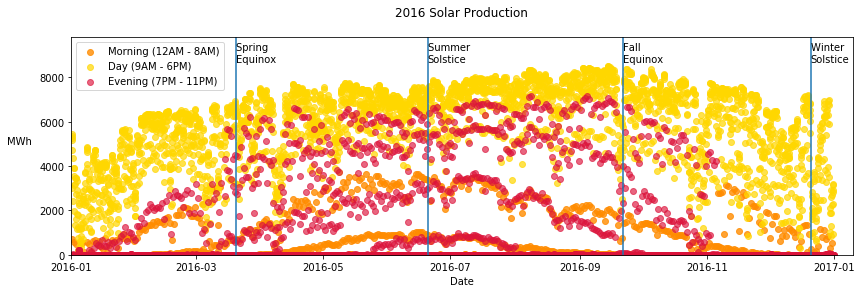

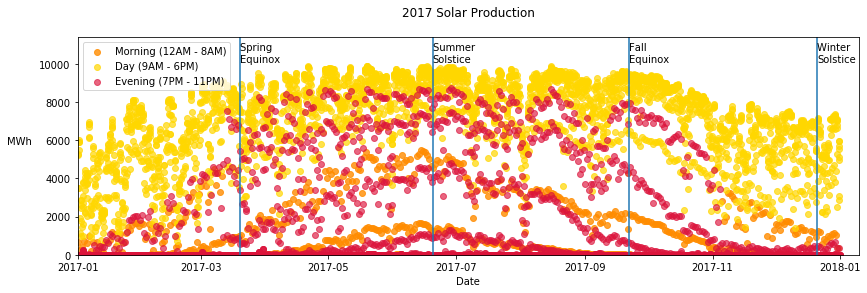

In [3]:
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

for year in range(2011,2018):
    data = full_data.loc[full_data['YEAR']==year,:]
    hour = data.loc[:,'Hour'].values
    mask_morning = ((hour < 9))
    mask_day = ((hour >= 9)&(hour <= 16))
    mask_evening = ((hour >16))
    #mask_night = ((hour < 6)|(hour >20))
    #mask_evening = ((hour > 15)&(hour < 21))
    #ask_morning = ((hour >5)&(hour<11))
    #mask_mid = ((hour >10)&(hour<16))
    x = data['TIMESTAMP']
    y = data['SOLAR TOTAL']
    plt.figure(figsize=(14,4))
    plt.scatter(x[mask_morning], y[mask_morning],c='#FF8C00',alpha=.8,label='Morning (12AM - 8AM)')
    plt.scatter(x[mask_day], y[mask_day],c='#FFD700',alpha=.7,label='Day (9AM - 6PM)')
    plt.scatter(x[mask_evening], y[mask_evening],c='#DC143C',alpha=.65,label='Evening (7PM - 11PM)')
    #plt.xlim(pd.to_datetime('01/01/12'),pd.to_datetime('12/31/12'))
    plt.ylim(0,y.max()*1.15)
    plt.xlim(pd.to_datetime('01/01/{}'.format(year)),pd.to_datetime('01/10/{}'.format(year+1)))
    plt.ylabel('MWh ',rotation='0',ha='right')
    plt.xlabel('Date')
    plt.title('{} Solar Production\n'.format(year))
    plt.legend(loc='upper left')
    seasons = [(pd.to_datetime('June 20, {}'.format(year)), 'Summer \nSolstice'),
           (pd.to_datetime('December 21, {}'.format(year)), 'Winter \nSolstice'),
           (pd.to_datetime('September 22, {}'.format(year)), 'Fall \nEquinox'),
           (pd.to_datetime('March 20, {}'.format(year)), 'Spring \nEquinox')]
    for date,season in seasons:
        plt.axvline(date)
        plt.text(date,y.max()*1.02,season)
    #plt.savefig('Charts/Seasons/{}_solar_production_seasons.png'.format(year))
    plt.show()

## Plotting wind production across the same Kaggle data set years.  
###### Broken into sections of time to show the variations in how much power is provided to the grid across a day throughout the year.

<Figure size 1008x288 with 0 Axes>

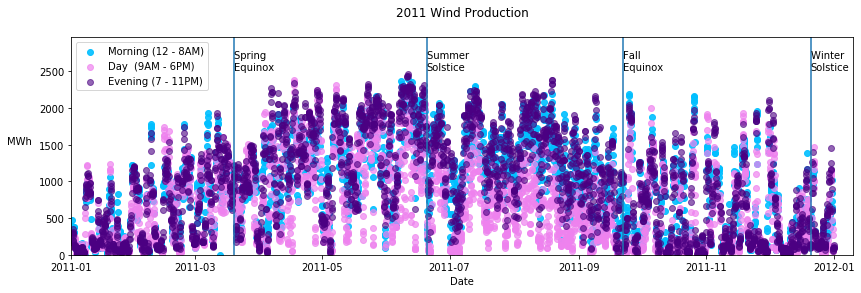

<Figure size 1008x288 with 0 Axes>

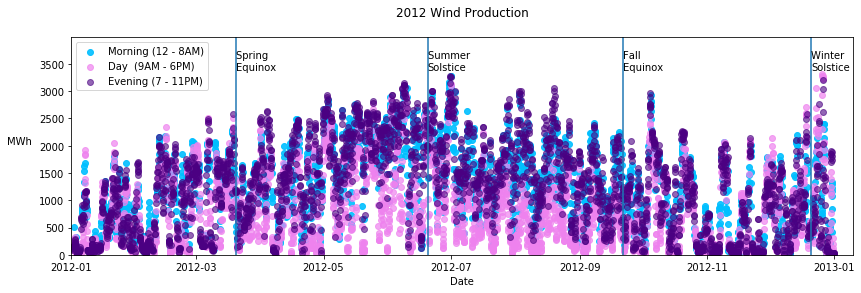

<Figure size 1008x288 with 0 Axes>

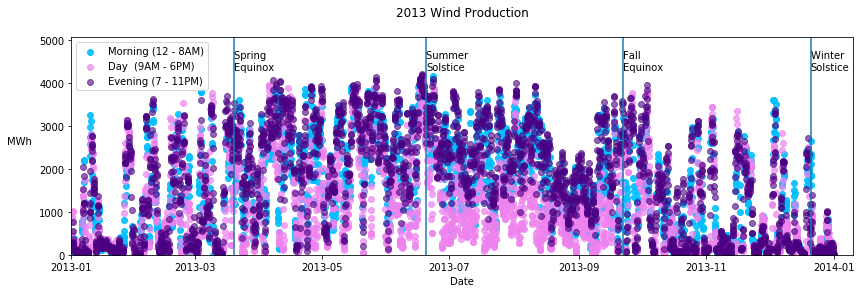

<Figure size 1008x288 with 0 Axes>

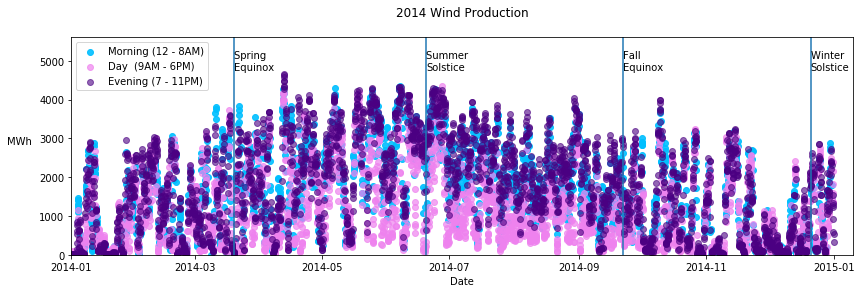

<Figure size 1008x288 with 0 Axes>

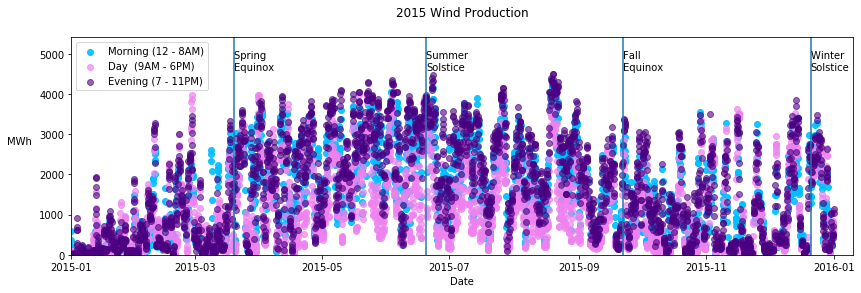

<Figure size 1008x288 with 0 Axes>

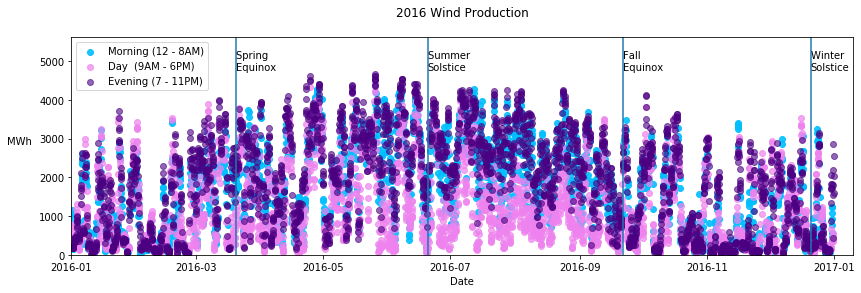

<Figure size 1008x288 with 0 Axes>

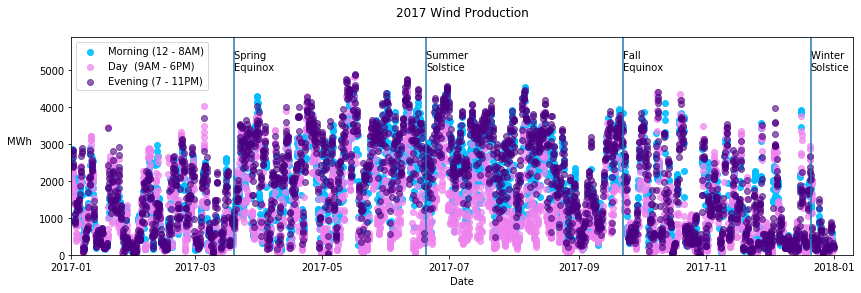

In [4]:
for year in range(2011,2018):
    data = full_data.loc[full_data['YEAR']==year,:]
    hour = data.loc[:,'Hour'].values
    mask_morning = ((hour < 9))
    mask_day = ((hour >= 9)&(hour <= 16))
    mask_evening = ((hour >16))
    mask_mid = ((hour >10)&(hour<16))
    masks = [mask_morning, mask_mid, mask_evening]
    plt.figure(figsize=(14,4))
    x = data['TIMESTAMP']
    y = data['WIND TOTAL']
    plt.figure(figsize=(14,4))
    plt.scatter(x[mask_morning], y[mask_morning],c='#00BFFF',alpha=.9,label='Morning (12 - 8AM)')
    plt.scatter(x[mask_day], y[mask_day],c='#EE82EE',alpha=.7,label='Day  (9AM - 6PM)')
    plt.scatter(x[mask_evening], y[mask_evening],c='#4B0082',alpha=.6,label='Evening (7 - 11PM)') 
   # plt.scatter(x[mask_night], y[mask_night],c='#4B0082',alpha=.65,label='Night')
    #plt.xlim(pd.to_datetime('01/01/12'),pd.to_datetime('12/31/12'))
    plt.xlim(pd.to_datetime('01/01/{}'.format(year)),pd.to_datetime('01/10/{}'.format(year+1)))
    plt.ylim(0,y.max()*1.2)
    plt.ylabel('MWh ',rotation='0',ha='right')
    plt.xlabel('Date')
    plt.title('{} Wind Production\n'.format(year))
    plt.legend(loc='upper left')
    seasons = [(pd.to_datetime('June 20, {}'.format(year)), 'Summer \nSolstice'),
           (pd.to_datetime('December 21, {}'.format(year)), 'Winter \nSolstice'),
           (pd.to_datetime('September 22, {}'.format(year)), 'Fall \nEquinox'),
           (pd.to_datetime('March 20, {}'.format(year)), 'Spring \nEquinox')]
    for date,season in seasons:
        plt.axvline(date)
        plt.text(date,y.max()*1.02,season)
    #if year in [2011,2017]:
      #  plt.savefig('Charts/Seasons/{}_wind_production_seasons.png'.format(year))
    plt.show()

<Figure size 1008x288 with 0 Axes>

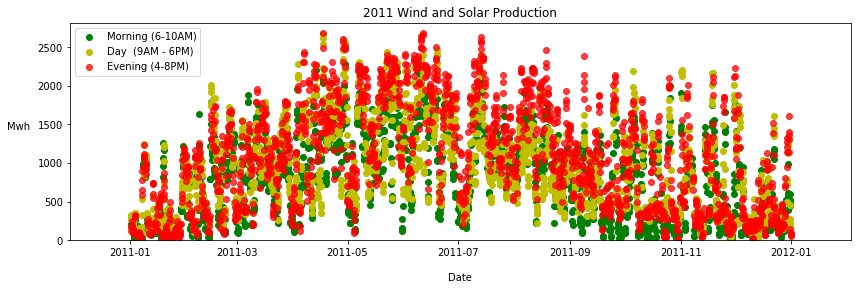

<Figure size 1008x288 with 0 Axes>

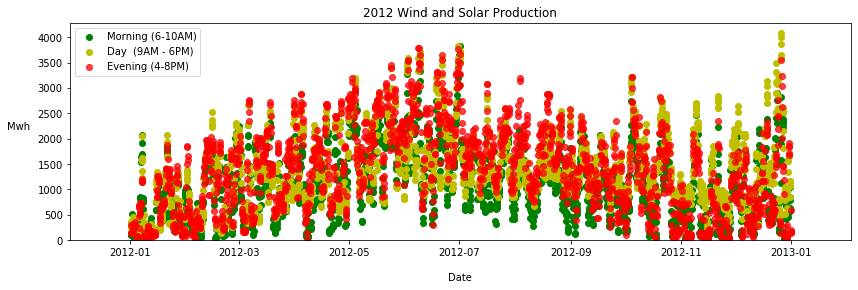

<Figure size 1008x288 with 0 Axes>

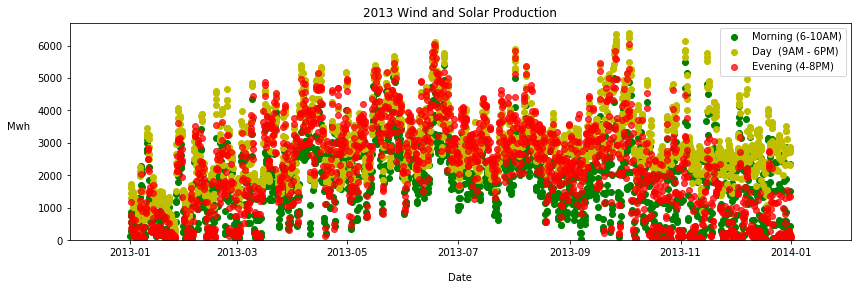

<Figure size 1008x288 with 0 Axes>

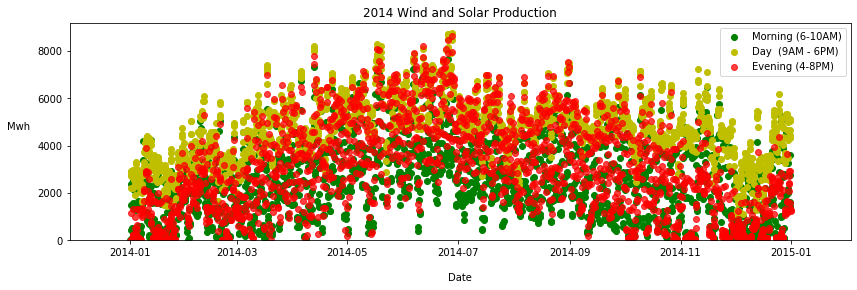

<Figure size 1008x288 with 0 Axes>

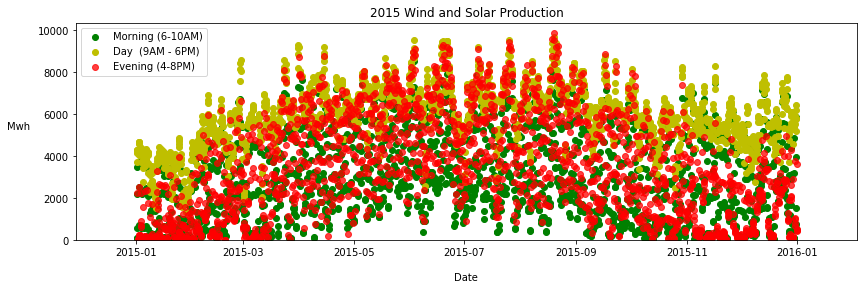

<Figure size 1008x288 with 0 Axes>

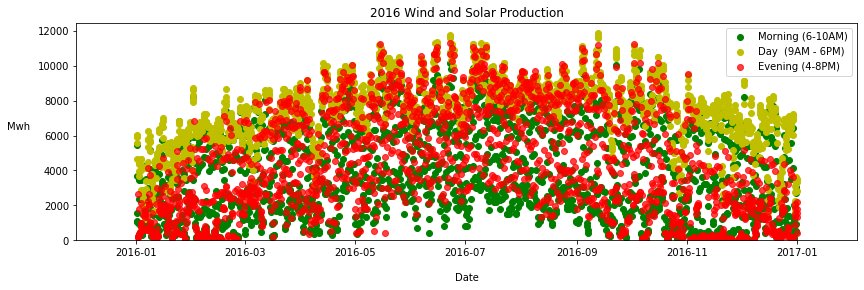

<Figure size 1008x288 with 0 Axes>

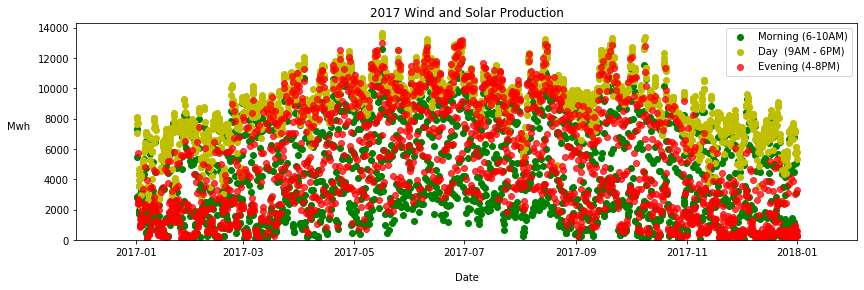

In [5]:
for year in range(2011,2018):
    data = full_data.loc[full_data['YEAR']==year,:]
    hour = data.loc[:,'Hour'].values
    mask_night = ((hour < 6)|(hour >20))
    mask_evening = ((hour > 15)&(hour < 21))
    mask_morning = ((hour >5)&(hour<11))
    mask_mid = ((hour >10)&(hour<16))
    masks = [mask_morning, mask_mid, mask_evening]
    plt.figure(figsize=(14,4))
    x = data['TIMESTAMP']
    y = data['WIND SOLAR']
    plt.figure(figsize=(14,4))
    plt.scatter(x[mask_morning], y[mask_morning],c='g',label='Morning (6-10AM)')
    plt.scatter(x[mask_mid], y[mask_mid],c='y',label='Day  (9AM - 6PM)')
    plt.scatter(x[mask_evening], y[mask_evening],c='r',alpha=.75,label='Evening (4-8PM)')
    #plt.xlim(pd.to_datetime('01/01/12'),pd.to_datetime('12/31/12'))
    plt.ylim(0,y.max()*1.05)
    plt.ylabel('Mwh ',rotation='0',ha='right')
    plt.xlabel('\nDate')
    plt.title('{} Wind and Solar Production'.format(year))
    plt.legend()
    plt.show()

<Figure size 1008x288 with 0 Axes>

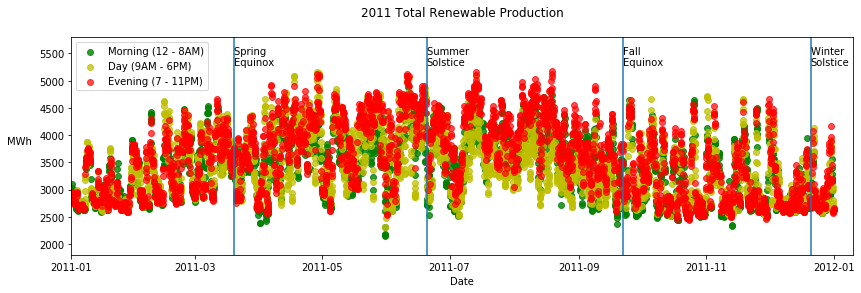

<Figure size 1008x288 with 0 Axes>

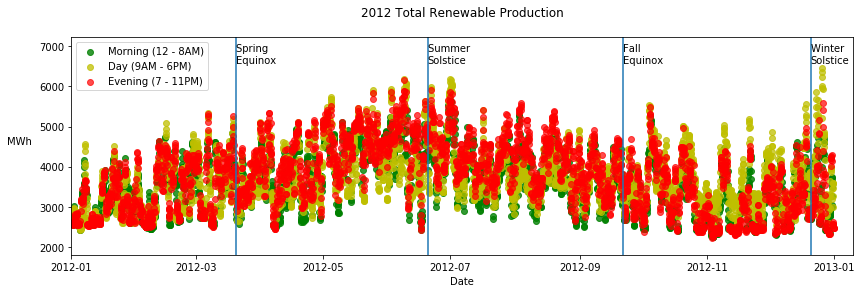

<Figure size 1008x288 with 0 Axes>

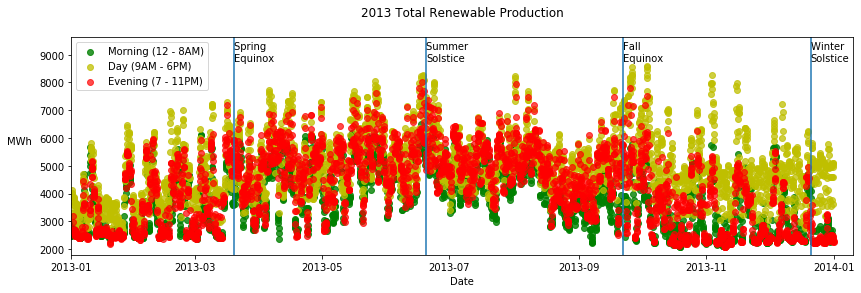

<Figure size 1008x288 with 0 Axes>

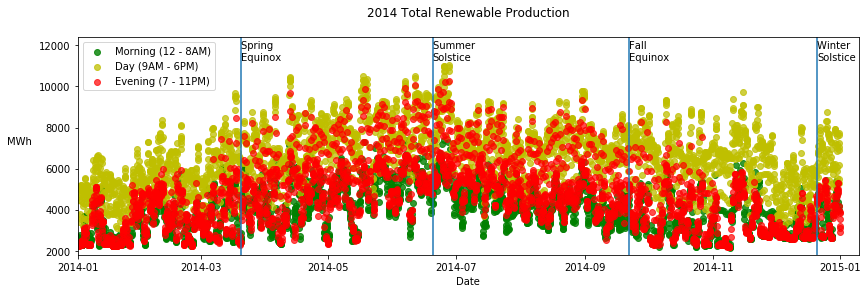

<Figure size 1008x288 with 0 Axes>

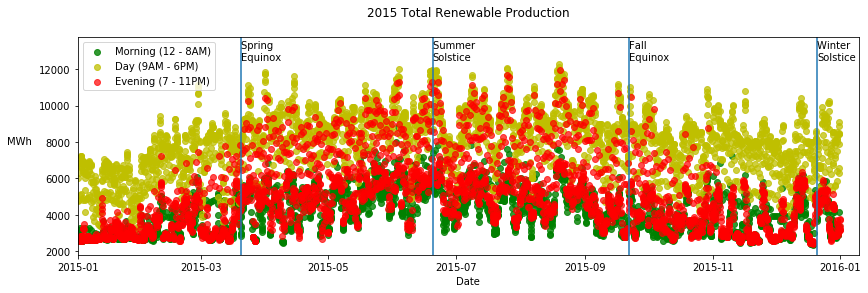

<Figure size 1008x288 with 0 Axes>

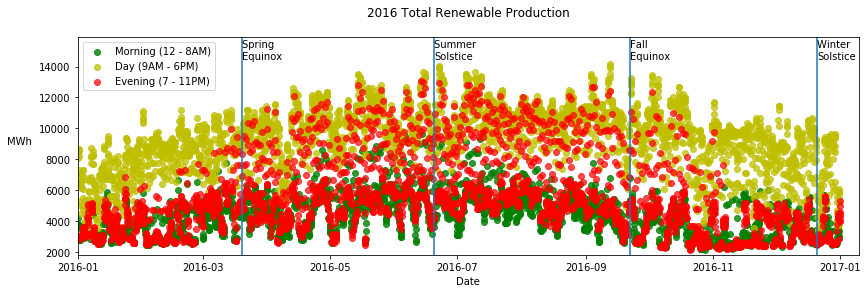

<Figure size 1008x288 with 0 Axes>

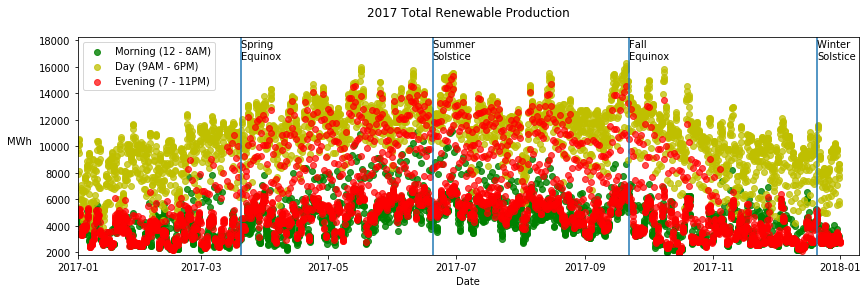

In [6]:
for year in range(2011,2018):
    data = full_data.loc[full_data['YEAR']==year,:]
    hour = data.loc[:,'Hour'].values
    mask_morning = ((hour < 9))
    mask_day = ((hour >= 9)&(hour <= 16))
    mask_evening = ((hour >16))
    mask_mid = ((hour >10)&(hour<16))
    plt.figure(figsize=(14,4))
    x = data['TIMESTAMP']
    y = data['RENEW TOTAL']
    plt.figure(figsize=(14,4))
    plt.scatter(x[mask_morning], y[mask_morning],c='g',alpha=.8,label='Morning (12 - 8AM)')
    plt.scatter(x[mask_day], y[mask_day],c='y',alpha=.75,label='Day (9AM - 6PM)')
    plt.scatter(x[mask_evening], y[mask_evening],c='r',alpha=.7,label='Evening (7 - 11PM)')
    #plt.xlim(pd.to_datetime('01/01/12'),pd.to_datetime('12/31/12'))
    plt.xlim(pd.to_datetime('01/01/{}'.format(year)),pd.to_datetime('01/10/{}'.format(year+1)))
    plt.ylim(1800,y.max()*1.12)
    plt.ylabel('MWh ',rotation='0',ha='right')
    plt.xlabel('Date')
    plt.title('{} Total Renewable Production\n'.format(year))
    plt.legend(loc='upper left')
    seasons = [(pd.to_datetime('June 20, {}'.format(year)), 'Summer \nSolstice'),
           (pd.to_datetime('December 21, {}'.format(year)), 'Winter \nSolstice'),
           (pd.to_datetime('September 22, {}'.format(year)), 'Fall \nEquinox'),
           (pd.to_datetime('March 20, {}'.format(year)), 'Spring \nEquinox')]
    for date,season in seasons:
        plt.axvline(date)
        plt.text(date,y.max()*1.02,season)
    #plt.savefig('Charts/Seasons/{}_total_renew_production_seasons.png'.format(year))
    plt.show()

## Plotting difference in solar power production from 2011 and 2017

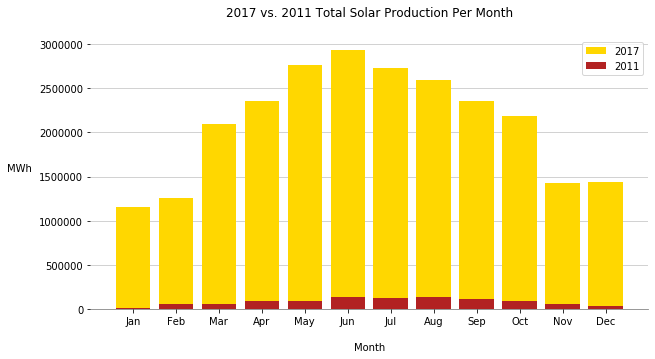

In [7]:
color = ['#FFD700','#B22222']
alpha = [1,1]
years = [2017,2011]


fig, ax = plt.subplots()

for i in range(len(years)):
    data = full_data.loc[full_data['YEAR']==years[i],:]
    grouped = data.groupby('MONTH')
    group_df = pd.DataFrame(grouped['SOLAR TOTAL'].sum()).reset_index()
    group_df['MONTH'] = group_df['MONTH'].map({1:'Jan',2:'Feb',3:'Mar',4:'Apr',5:'May',6:'Jun',7:'Jul',8:'Aug',9:'Sep',10:'Oct',11:'Nov',12:'Dec'})
    plt.bar(group_df['MONTH'],group_df['SOLAR TOTAL'],color=color[i],alpha=alpha[i],label=years[i])
fig.set_figheight(5)
fig.set_figwidth(10)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_alpha(0.5)
ax.set_axisbelow(True)
plt.grid(axis='y',alpha=.7)
plt.ylabel('MWh ',rotation='0',ha='right')
plt.xlabel('\nMonth')
plt.title('2017 vs. 2011 Total Solar Production Per Month\n')

plt.legend()
#plt.savefig('Charts/Montly_Yearly/2017vs2011_Solar_per_month.png'.format(year),bbox_inches='tight')
plt.show()

## Plotting difference in wind production between 2011 and 2017

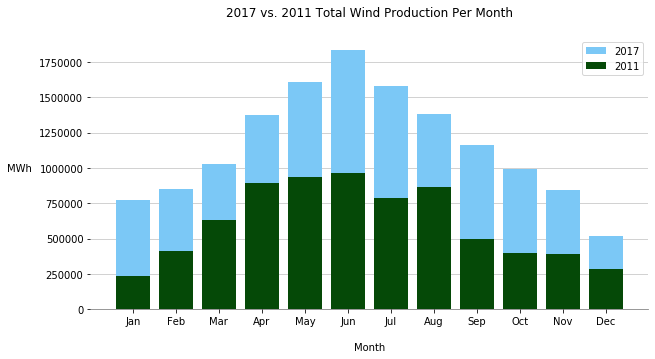

In [8]:
color = ['xkcd:lightblue','xkcd:darkgreen']
alpha = [1,1]
years = [2017,2011]


fig, ax = plt.subplots()

for i in range(len(years)):
    data = full_data.loc[full_data['YEAR']==years[i],:]
    grouped = data.groupby('MONTH')
    group_df = pd.DataFrame(grouped['WIND TOTAL'].sum()).reset_index()
    group_df['MONTH'] = group_df['MONTH'].map({1:'Jan',2:'Feb',3:'Mar',4:'Apr',5:'May',6:'Jun',7:'Jul',8:'Aug',9:'Sep',10:'Oct',11:'Nov',12:'Dec'})
    plt.bar(group_df['MONTH'],group_df['WIND TOTAL'],color=color[i],alpha=alpha[i],label=years[i])
fig.set_figheight(5)
fig.set_figwidth(10)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_alpha(0.5)
ax.set_axisbelow(True)
plt.grid(axis='y',alpha=.7)
plt.ylabel('MWh ',rotation='0',ha='right')
plt.xlabel('\nMonth')
plt.title('2017 vs. 2011 Total Wind Production Per Month\n')

plt.legend()
#plt.savefig('Charts/Montly_Yearly/2017vs2011_Wind_prod_per_month.png',bbox_inches='tight')
plt.show()

## Plotting difference in combined wind and solar production 2011 - 2017

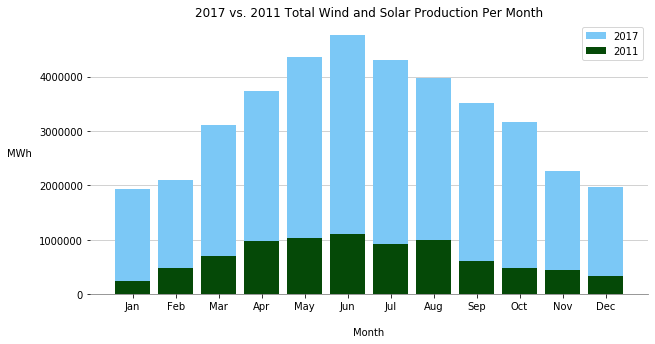

In [9]:
color = ['xkcd:lightblue','xkcd:darkgreen']
alpha = [1,1]
years = [2017,2011]


fig, ax = plt.subplots()

for i in range(len(years)):
    data = full_data.loc[full_data['YEAR']==years[i],:]
    grouped = data.groupby('MONTH')
    group_df = pd.DataFrame(grouped['WIND SOLAR'].sum()).reset_index()
    group_df['MONTH'] = group_df['MONTH'].map({1:'Jan',2:'Feb',3:'Mar',4:'Apr',5:'May',6:'Jun',7:'Jul',8:'Aug',9:'Sep',10:'Oct',11:'Nov',12:'Dec'})
    plt.bar(group_df['MONTH'],group_df['WIND SOLAR'],color=color[i],alpha=alpha[i],label=years[i])
fig.set_figheight(5)
fig.set_figwidth(10)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_alpha(0.5)
ax.set_axisbelow(True)
plt.grid(axis='y',alpha=.7)
plt.ylabel('MWh ',rotation='0',ha='right')
plt.xlabel('\nMonth')
plt.title('2017 vs. 2011 Total Wind and Solar Production Per Month')

plt.legend()
#plt.savefig('Charts/Montly_Yearly/2017vs2011_WindAndSolar_prod_per_month.png'.format(year),bbox_inches='tight')
plt.show()

## Plotting difference in total renewale production 2011 - 2017




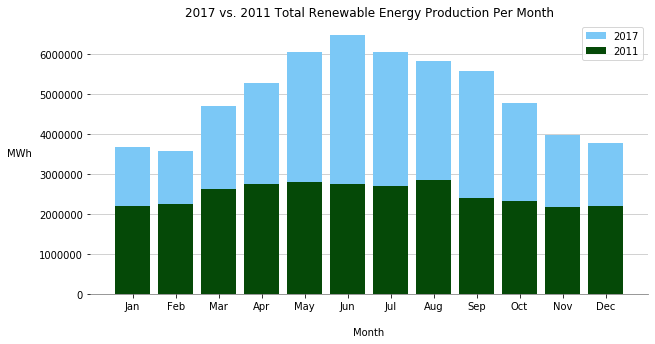

In [10]:
color = ['xkcd:lightblue','xkcd:darkgreen']
alpha = [1,1]
years = [2017,2011]


fig, ax = plt.subplots()

for i in range(len(years)):
    data = full_data.loc[full_data['YEAR']==years[i],:]
    grouped = data.groupby('MONTH')
    group_df = pd.DataFrame(grouped['RENEW TOTAL'].sum()).reset_index()
    group_df['MONTH'] = group_df['MONTH'].map({1:'Jan',2:'Feb',3:'Mar',4:'Apr',5:'May',6:'Jun',7:'Jul',8:'Aug',9:'Sep',10:'Oct',11:'Nov',12:'Dec'})
    plt.bar(group_df['MONTH'],group_df['RENEW TOTAL'],color=color[i],alpha=alpha[i],label=years[i])
fig.set_figheight(5)
fig.set_figwidth(10)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_alpha(0.5)
ax.set_axisbelow(True)
plt.grid(axis='y',alpha=.7)
plt.ylabel('MWh ',rotation='0',ha='right')
plt.xlabel('\nMonth')
plt.title('2017 vs. 2011 Total Renewable Energy Production Per Month')

legend = plt.legend()
plt.setp(legend.get_texts(), color='k')
#plt.savefig('Charts/Montly_Yearly/2017vs2011_TotalRenewable_prod_per_month.png',bbox_inches='tight')
plt.show()

## Plotting average daily trend in daily production for total renewables 2011 - 2017



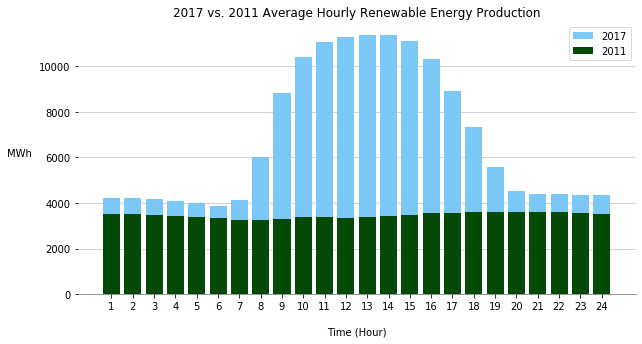

In [11]:
color = ['xkcd:lightblue','xkcd:darkgreen']
alpha = [1,1]
years = [2017,2011]


fig, ax = plt.subplots()

for i in range(len(years)):
    data = full_data.loc[full_data['YEAR']==years[i],:]
    grouped = data.groupby('Hour')
    group_df = pd.DataFrame(grouped['RENEW TOTAL'].mean()).reset_index()
    plt.bar(group_df['Hour'],group_df['RENEW TOTAL'],color=color[i],alpha=alpha[i],label=years[i])
fig.set_figheight(5)
fig.set_figwidth(10)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_alpha(0.5)
ax.set_axisbelow(True)
plt.grid(axis='y',alpha=.7)
plt.ylabel('MWh ',rotation='0',ha='right')
plt.xlabel('\nTime (Hour)')
plt.xticks(range(1,25))
plt.title('2017 vs. 2011 Average Hourly Renewable Energy Production')

plt.legend()
#plt.savefig('Charts/Montly_Yearly/2017vs2011_Average_hourly_renewable_production.png', bbox_inches='tight')
plt.show()

## Plotting total production across 2011 - 2017 per year 
###### cumulative production of total renewables, solar, wind, and combined wind and solar

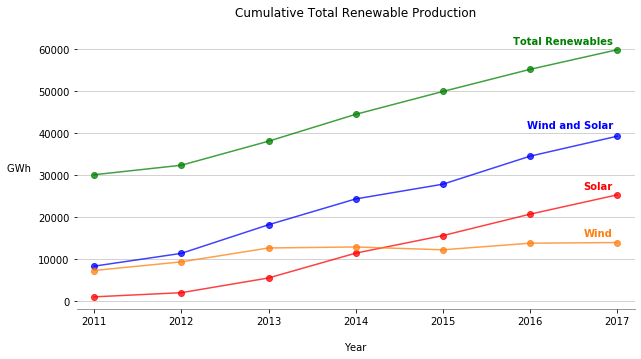

In [12]:
fig, ax = plt.subplots()

grouped = full_data.groupby('YEAR')
grouped_df = pd.DataFrame(grouped['RENEW TOTAL'].sum())
grouped_df.drop(index=[2010,2018],inplace=True)
grouped_df['RENEW TOTAL'] = grouped_df['RENEW TOTAL']/1000
grouped_df['WIND SOLAR'] = grouped['WIND SOLAR'].sum()
grouped_df['WIND SOLAR'] = grouped_df['WIND SOLAR']/1000
grouped_df['SOLAR TOTAL'] = grouped['SOLAR TOTAL'].sum()
grouped_df['SOLAR TOTAL'] = grouped_df['SOLAR TOTAL']/1000
grouped_df['WIND TOTAL'] = grouped['WIND TOTAL'].sum()
grouped_df['WIND TOTAL'] = grouped_df['WIND TOTAL']/1000

plt.plot(grouped_df.index,grouped_df['RENEW TOTAL'],color='g',marker='o',alpha=.75,label='Totoal Renewables')
plt.plot(grouped_df.index, grouped_df['WIND SOLAR'], color='b',marker='o',alpha=.75,label='Wind and Solar')
plt.plot(grouped_df.index, grouped_df['SOLAR TOTAL'], color='r',marker='o',alpha=.75,label='Solar')
plt.plot(grouped_df.index, grouped_df['WIND TOTAL'], color='C1',marker='o',alpha=.75,label='Wind')

fig.set_figheight(5)
fig.set_figwidth(10)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_alpha(0.5)
ax.set_axisbelow(True)
plt.grid(axis='y',alpha=.7)
plt.ylabel('GWh ',rotation='0',ha='right')
plt.xlim(2010.8,2017.2)
plt.xlabel('\nYear')
plt.title('Cumulative Total Renewable Production\n')

ax.annotate('Total Renewables',(2016.95,61000),ha='right',color='g',weight='bold',clip_on=True)
ax.annotate('Wind and Solar',(2016.95,41000),ha='right',color='b',weight='bold',clip_on=True)
ax.annotate('Solar',(2016.95,26500),ha='right',color='r',weight='bold',clip_on=True)
ax.annotate('Wind',(2016.95,15500),ha='right',color='C1',weight='bold',clip_on=True)

#plt.savefig('Charts/Montly_Yearly/Yearly_renewable_production_2010-2017.png', bbox_inches='tight')
plt.show()

### CAISO Demand Jan 2016 to Dec 2017

### Proportion of Total Demand Provided by Renewables per Month in 2016

## Plotting scatter chart of other renewable resources not analyzed in detail

<Figure size 1008x288 with 0 Axes>

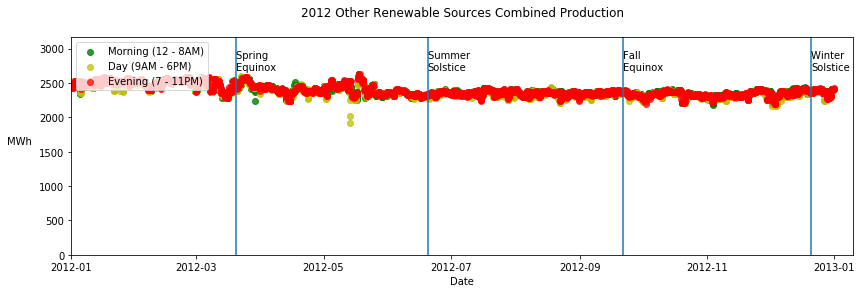

<Figure size 1008x288 with 0 Axes>

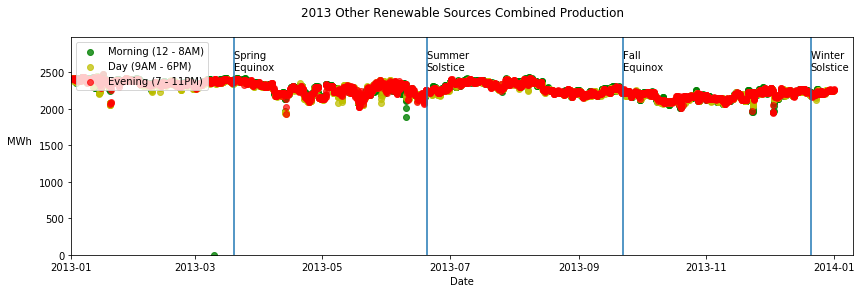

<Figure size 1008x288 with 0 Axes>

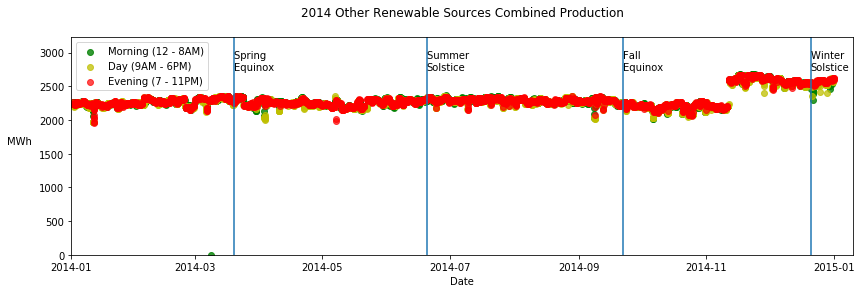

<Figure size 1008x288 with 0 Axes>

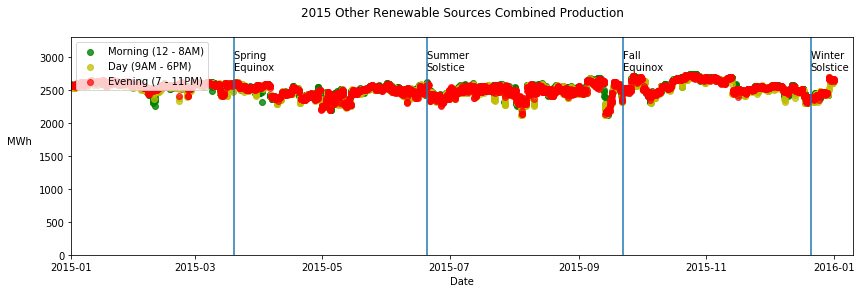

<Figure size 1008x288 with 0 Axes>

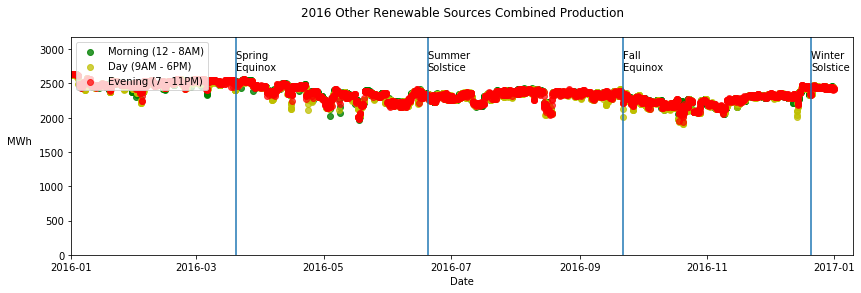

<Figure size 1008x288 with 0 Axes>

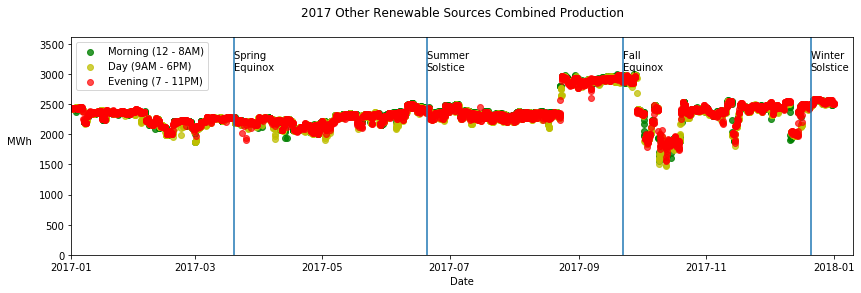

In [19]:
for year in range(2012,2018):
    data = full_data.loc[full_data['YEAR']==year,:]
    hour = data.loc[:,'Hour'].values
    mask_morning = ((hour < 9))
    mask_day = ((hour >= 9)&(hour <= 16))
    mask_evening = ((hour >16))
    mask_mid = ((hour >10)&(hour<16))
    masks = [mask_morning, mask_mid, mask_evening]
    plt.figure(figsize=(14,4))
    x = data['TIMESTAMP']
    y = data['COMBINED SMALLER SOURCES']
    plt.figure(figsize=(14,4))
    plt.scatter(x[mask_morning], y[mask_morning],c='g',alpha=.8,label='Morning (12 - 8AM)')
    plt.scatter(x[mask_day], y[mask_day],c='y',alpha=.75,label='Day (9AM - 6PM)')
    plt.scatter(x[mask_evening], y[mask_evening],c='r',alpha=.7,label='Evening (7 - 11PM)')
    plt.xlim(pd.to_datetime('01/01/{}'.format(year)),pd.to_datetime('01/10/{}'.format(year+1)))
    plt.ylim(0,y.max()*1.2)
    plt.ylabel('MWh ',rotation='0',ha='right')
    plt.xlabel('Date')
    plt.title('{} Other Renewable Sources Combined Production\n'.format(year))
    plt.legend(loc='upper left')
    seasons = [(pd.to_datetime('June 20, {}'.format(year)), 'Summer \nSolstice'),
           (pd.to_datetime('December 21, {}'.format(year)), 'Winter \nSolstice'),
           (pd.to_datetime('September 22, {}'.format(year)), 'Fall \nEquinox'),
           (pd.to_datetime('March 20, {}'.format(year)), 'Spring \nEquinox')]
    for date,season in seasons:
        plt.axvline(date)
        plt.text(date,y.max()*1.02,season)
    #if year in [2012,2017]:
     #   plt.savefig('Charts/Seasons/{}_other_sources_production_seasons.png'.format(year))
    plt.show()

## Importing Electricity Consuption by County Data

###### On average, CAISO provided 81.6% of California's overall electricty.  Took the total production values per county per year and got a yearly sum for the yearly power consuption.  Then multiplied this by 0.816 to get an estimate of CAISO's demand across those years.  

In [21]:
county_data = pd.read_csv(r"data\ElectricityByCounty.csv")
county_data.head()

,County,Sector,2018,2017,2016,2015,2014,2013,2012,2011,Total Usage
0,ALAMEDA,Total,10343.892364,11106.369400,10814.694495,10257.332710,10318.357038,10634.931009,10602.778217,10990.092975,85068.448208
1,ALPINE,Total,18.677135,18.976912,17.415654,16.209900,15.983364,18.176468,13.888339,14.293288,133.621060
2,AMADOR,Total,299.154772,313.520037,309.635323,285.623785,289.598598,310.384025,321.817592,310.221184,2439.955316
3,BUTTE,Total,1474.660297,1534.492656,1486.524542,1496.990082,1491.908668,1504.429510,1508.130470,1439.721545,11936.857770
4,CALAVERAS,Total,333.097984,347.728906,315.900716,311.087202,318.903628,325.877542,325.739716,325.086665,2603.422359


In [22]:
years = {}
for year in county_data.drop(columns=['County','Sector','Total Usage','2018']).columns:
    years[year] = (county_data.loc[:,year].sum()*.816)

    
years 
years.keys()
years.values()
years = pd.DataFrame({
    'Years':[*years.keys()],
    'Total Useage':[*years.values()]
})
years['YEAR'] = years['Years'].astype(int)
years.drop(columns=['Years'],inplace=True)


## Plotting renewable contribution per year for CAISO grid

,YEAR,RENEW TOTAL,Total Useage,Percent By Renew
0,2011,30050.803000,226376.422297,13%
1,2012,32308.246936,230853.251902,14%
2,2013,38021.107000,229336.965819,17%
3,2014,44406.363000,231422.522248,19%
4,2015,49836.654000,231032.127020,22%
5,2016,55097.629000,231765.954607,24%
6,2017,59751.971000,235523.665391,25%


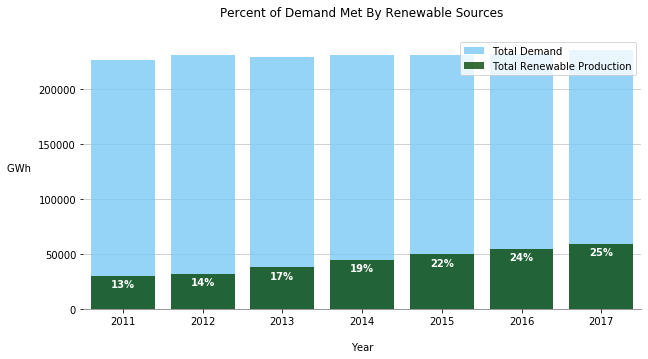

In [24]:
 




fig, ax = plt.subplots()

grouped = full_data.groupby('YEAR')
grouped_df = pd.DataFrame(grouped['RENEW TOTAL'].sum())
grouped_df.drop(index=[2010,2018],inplace=True)
grouped_df['RENEW TOTAL'] = grouped_df['RENEW TOTAL']/1000

combined = grouped_df.reset_index().merge(years, on='YEAR')
combined['Percent By Renew'] = (combined['RENEW TOTAL']/combined['Total Useage'])*100
combined['Percent By Renew'] = combined['Percent By Renew'].map('{:.0f}%'.format)
display(combined)

plt.bar(years['YEAR'],years['Total Useage'],color='xkcd:lightblue',alpha=.8,label='Total Demand')

plt.bar(grouped_df.index,grouped_df['RENEW TOTAL'],color='xkcd:darkgreen',alpha=.8,label='Total Renewable Production')

fig.set_figheight(5)
fig.set_figwidth(10)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_alpha(0.5)
ax.set_axisbelow(True)
plt.grid(axis='y',alpha=.7)
plt.ylabel('GWh ',rotation='0',ha='right')
#plt.ylim(30000,280000)
plt.xlim(2010.5,2017.5)
plt.xlabel('\nYear')
plt.title('Percent of Demand Met By Renewable Sources\n')
plt.legend()


percent = list(combined['Percent By Renew'].astype(str))
x = list(combined['YEAR'].astype(int))
y= list(combined['RENEW TOTAL'].astype(int))



for i, txt in enumerate(percent):
    ax.annotate(txt,( x[i],y[i]-3000),ha='center',va='top',fontweight='bold',color='w')
#plt.savefig('Charts/Montly_Yearly/Yearly_percent_of_total_year_demand.png', bbox_inches='tight')
plt.show()

# Predicting California Renewable Production

### Using Facebook Prophet time series 

###### Making a lot of changes to mess around/ learn the prophet module

###### First fitting to total renewable produciton 

In [2]:
from fbprophet import Prophet
from sklearn.preprocessing import StandardScaler


In [13]:
#ADDED TOO MANY EXTRA REGRESSORS 
#NEED TO REMOVE SOME AND CHANGE OTHERS
#BEST ACC HAS BEEN WITH JUST DAYTIME REGRESSOR AND LOW CHANGEPOINT RANGE
#ON/OFF SEASON DAILY SEASONALITY SEEMS TO BE GOOD 
full_data = full_data.set_index(pd.DatetimeIndex(full_data['TIMESTAMP']))

y = full_data['RENEW TOTAL']
#daily_renew = y.resample('4H').sum()
daily_renew = y
dd = pd.DataFrame(daily_renew).reset_index()


def on_seasonr(ds):
    date = pd.to_datetime(ds)
    if ((date.month >= 3) & (date.month <= 9)):
        return 1
    else:
        return 0

def on_season(ds):
    date = pd.to_datetime(ds)
    return ((date.month >= 3) & (date.month <= 9))

def daytime(ds):
    date = pd.to_datetime(ds)
    if ((date.hour <= 7)|(date.hour > 19)):
        return -1
    elif date.hour <= 11:
        return 0
    elif date.hour <=16:
        return 2
    elif date.hour <=19:
        return 0
    
def equinox(ds):
    date = pd.to_datetime(ds)
    if ((date <= pd.to_datetime('03-20-{}'.format(date.year))) & (date >= pd.to_datetime('02-01-{}'.format(date.year)))):
        return 0
    elif date <= pd.to_datetime('06-20-{}'.format(date.year)):
        return 2
    elif date <= pd.to_datetime('09-22-{}'.format(date.year)):
        return 2
    elif date <= pd.to_datetime('12-01-{}'.format(date.year)):
        return 0
    else:
        return -1
def get_year(ds):
    date = pd.to_datetime(ds)
    if date.year <= 2014:
        return -2
    elif date.year <= 2015:
        return -1
    elif date.year <= 2016:
        return 0
    elif date.year <= 2017:
        return 1
    elif date.year <= 2018:
        return 2


dd.columns = ['ds','y']

scaler = StandardScaler()

dd['cap'] = 17000
dd['cap'] = np.log(dd['cap'])

dd['on_season'] = dd['ds'].apply(on_season)
dd['off_season'] = ~dd['ds'].apply(on_season)
dd['daytime'] = dd['ds'].apply(daytime)
#dd['equinox'] = dd['ds'].apply(equinox)
dd['on_seasonr'] = dd['ds'].apply(on_seasonr)
#dd['year'] = dd['ds'].apply(get_year)
dd['y'] = dd['y'].replace(0,dd['y'].median())
#dd['y'] = np.cbrt(dd['y'])
#dd['y'] = 1/np.sqrt(dd['y'])
dd['y'] = np.log(dd['y'])
#dd['y'] = 1/np.sqrt(dd['y'])

#on_seasonv = dd['on_season'].values
#on_seasonv = on_seasonv.reshape(-1,1)

#equinoxv = dd['equinox'].values
#equinoxv = equinoxv.reshape(-1,1)

daytimev = dd['daytime'].values
daytimev = daytimev.reshape(-1,1)

#yearv = dd['year'].values
#yearv = yearv.reshape(-1,1)

#dd['year'] = scaler.fit_transform(yearv)
#dd['equinox'] =  scaler.fit_transform(equinoxv)
dd['daytime'] = scaler.fit_transform(daytimev)

dd_train = pd.DataFrame(dd.loc[((dd['ds'] >= pd.to_datetime('01/01/2014'))&(dd['ds'] < pd.to_datetime('01/01/2017')))])


display(dd_train.head(8))
print(y.iloc[0:5].sum())
print(y.iloc[5:8].sum())
dd_train.info()

,ds,y,cap,on_season,off_season,daytime,on_seasonr
144,2015-09-28 00:00:00,8.242493,9.740969,True,False,-0.795932,1
145,2015-09-28 01:00:00,8.252185,9.740969,True,False,-0.795932,1
146,2015-09-28 02:00:00,8.206038,9.740969,True,False,-0.795932,1
147,2015-09-28 03:00:00,8.245384,9.740969,True,False,-0.795932,1
148,2015-09-28 04:00:00,8.216628,9.740969,True,False,-0.795932,1
149,2015-09-28 05:00:00,8.137396,9.740969,True,False,-0.795932,1
150,2015-09-28 06:00:00,8.128585,9.740969,True,False,-0.795932,1
151,2015-09-28 07:00:00,8.288283,9.740969,True,False,-0.795932,1


20634.0
11754.0
<class 'pandas.core.frame.DataFrame'>
Int64Index: 26232 entries, 144 to 67535
Data columns (total 7 columns):
ds            26232 non-null datetime64[ns]
y             26232 non-null float64
cap           26232 non-null float64
on_season     26232 non-null bool
off_season    26232 non-null bool
daytime       26232 non-null float64
on_seasonr    26232 non-null int64
dtypes: bool(2), datetime64[ns](1), float64(3), int64(1)
memory usage: 1.3 MB


In [7]:
model = Prophet(changepoint_range=.35,weekly_seasonality=False,daily_seasonality=False,yearly_seasonality=150,
               growth='logistic',changepoint_prior_scale=0.7)
#model.add_seasonality(name='monthly',period=30.5, fourier_order=3)
model.add_seasonality(name='on_season_daily',period=1,condition_name='on_season', fourier_order=8)
model.add_seasonality(name='off_season_daily',period=1,condition_name='off_season', fourier_order=8)
#model.add_seasonality(name='equinox',period=365//4,fourier_order=10//4)
model.add_regressor('daytime')
#model.add_regressor('equinox')
model.add_regressor('on_seasonr')
#model.add_regressor('year')
model.fit(dd_train)

future = model.make_future_dataframe(periods=365*24,freq='1H')
future['on_season'] = future['ds'].apply(on_season)
#future['equinox'] = future['ds'].apply(equinox)
future['off_season'] = ~future['ds'].apply(on_season)
future['daytime'] = future['ds'].apply(daytime)
future['on_seasonr'] = future['ds'].apply(on_seasonr)
#future['year'] = future['ds'].apply(get_year)
future['cap'] = 16200
future['cap'] = np.log(future['cap'])

#yearf = future['on_season'].values
#yearf = yearf.reshape(-1,1)

#equinoxf = future['equinox'].values
#equinoxf = equinoxf.reshape(-1,1)

daytimef = future['daytime'].values
daytimef = daytimef.reshape(-1,1)

#future['year'] = scaler.fit_transform(yearf)
#future['equinox'] = scaler.fit_transform(equinoxf)
future['daytime'] = scaler.fit_transform(daytimef)

forcast = model.predict(future)

NameError: name 'dd_train' is not defined

,ds,trend,cap,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,...,on_seasonr,on_seasonr_lower,on_seasonr_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2014-01-01 00:00:00,8.438688,9.692767,7.566779,8.064728,8.438688,8.438688,-0.628972,-0.628972,-0.628972,...,0.0,0.0,0.0,-0.351192,-0.351192,-0.351192,0.0,0.0,0.0,7.809716
1,2014-01-01 01:00:00,8.438711,9.692767,7.571457,8.077175,8.438711,8.438711,-0.629162,-0.629162,-0.629162,...,0.0,0.0,0.0,-0.356927,-0.356927,-0.356927,0.0,0.0,0.0,7.809549
2,2014-01-01 02:00:00,8.438734,9.692767,7.566611,8.057865,8.438734,8.438734,-0.633973,-0.633973,-0.633973,...,0.0,0.0,0.0,-0.362579,-0.362579,-0.362579,0.0,0.0,0.0,7.804761
3,2014-01-01 03:00:00,8.438757,9.692767,7.540288,8.040161,8.438757,8.438757,-0.654775,-0.654775,-0.654775,...,0.0,0.0,0.0,-0.368125,-0.368125,-0.368125,0.0,0.0,0.0,7.783981
4,2014-01-01 04:00:00,8.438779,9.692767,7.517037,8.027860,8.438779,8.438779,-0.660543,-0.660543,-0.660543,...,0.0,0.0,0.0,-0.373545,-0.373545,-0.373545,0.0,0.0,0.0,7.778236


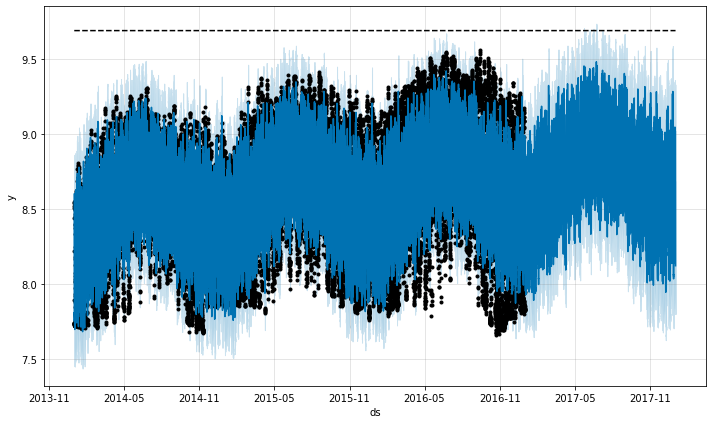

In [15]:
model.plot(forcast)
forcast.head()


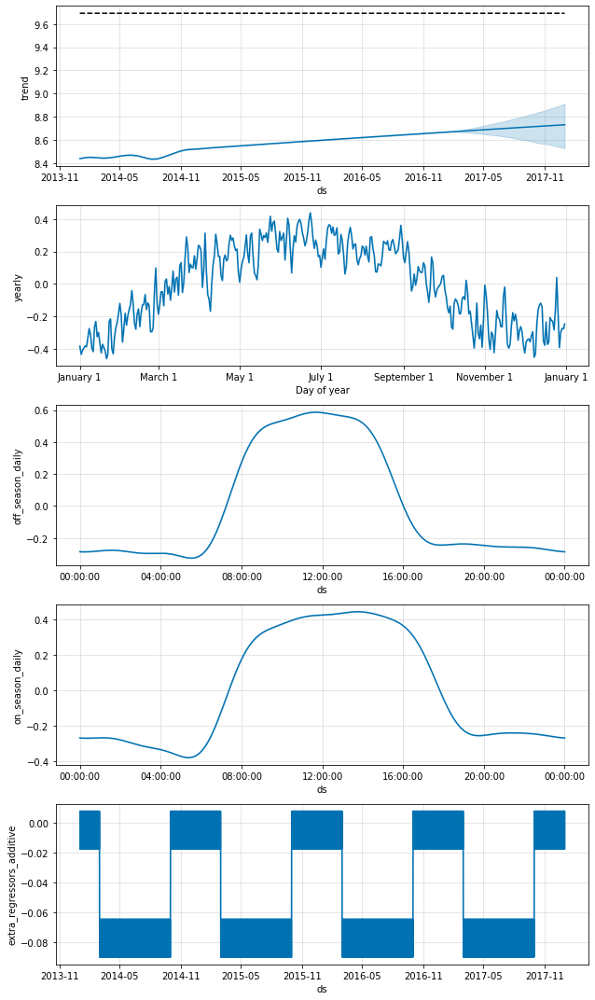

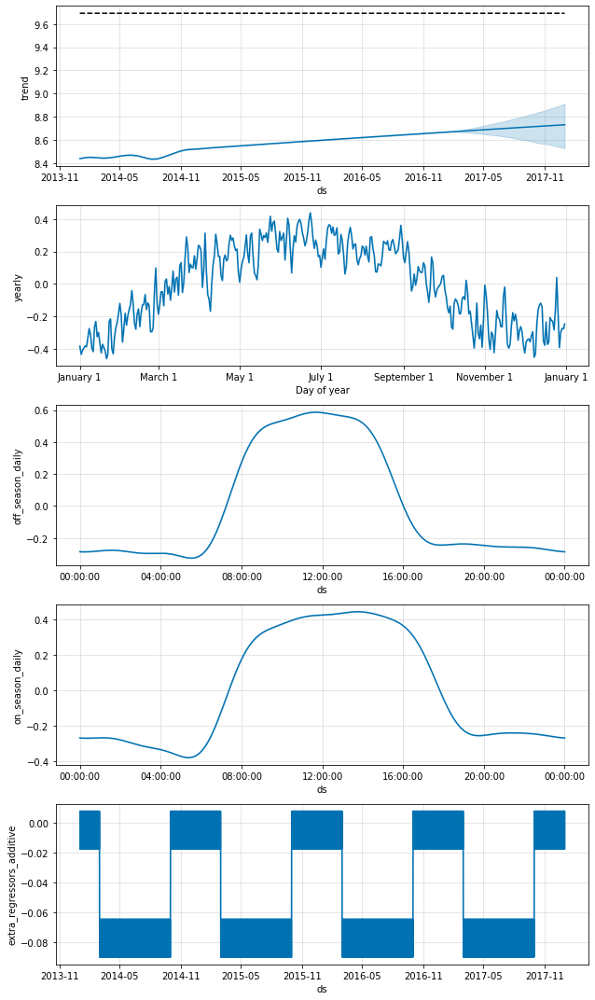

In [16]:
model.plot_components(forcast)

In [17]:
dd['y'] = np.exp(dd['y'])
#dd['y'] = (dd['y'])**3
dd_train['y'] = np.exp(dd_train['y'])
#dd_train['y'] = (dd_train['y'])**3
forcast['yhat'] = np.exp(forcast['yhat'])
#forcast['yhat'] = (forcast['yhat'])**3
dd_test = dd.loc[dd['ds']>pd.to_datetime('01/01/2017')]

In [ ]:

plt.figure(figsize=(15,10))

plt.scatter(dd_train['ds'],dd_train['y'], color='b',alpha=.55,edgecolor='w',label='Training Data True Production')
plt.scatter(dd_test['ds'],dd_test['y'],color='y',alpha=.55,edgecolor='w',label='Testing Data True Production')
plt.scatter(forcast['ds'],forcast['yhat'],color='r',alpha=.75,edgecolor='k',label='Predicted Production')

plt.xlim(pd.to_datetime('01/01/2014'),pd.to_datetime('01/01/2018'))
plt.ylabel('MWh Production')
plt.xlabel('Year')
plt.legend()
plt.grid(axis='y',alpha=.7)
#plt.ylim(bottom=0,top =300000)
plt.title("Predictions of Total Renewable Production per Day in California",fontweight='bold')
plt.show()

Predicted Total Renewable Production 2017:  54267.0
True Total Renewable Production 2017:  59751.0
Error in year total prediction in GWh:  -5485.0


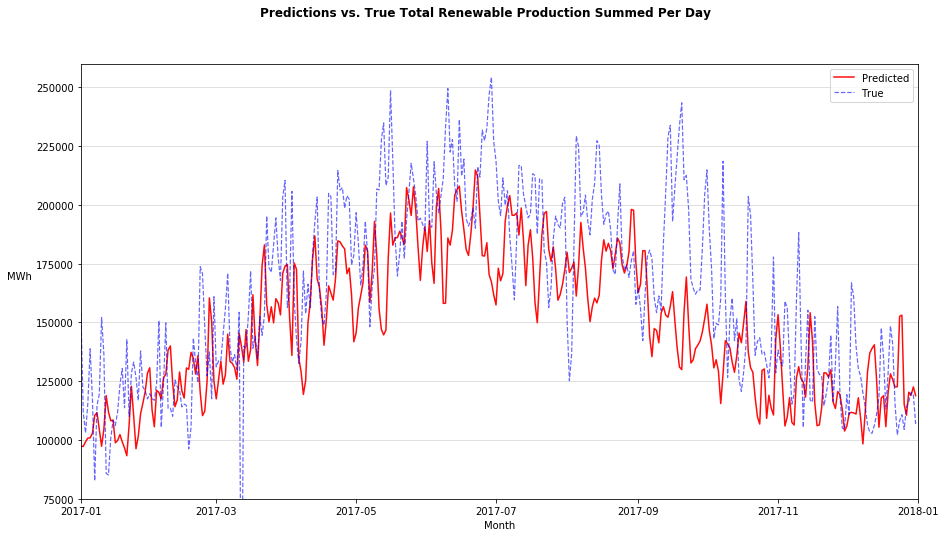

Test MAPE:  15.236467322906892
Train R2:  0.8063730021258582
Test MAPE:  22.45037450653089
Test R2:  0.7179191564653633


In [19]:
yhat = pd.DataFrame(forcast.loc[((forcast['ds'] >= pd.to_datetime('01/01/2017')) & (forcast['ds'] < pd.to_datetime('01/01/2018'))),['yhat','ds']])
true = pd.DataFrame(dd.loc[((dd['ds'] >= pd.to_datetime('01/01/2017')) & (dd['ds'] < pd.to_datetime('01/01/2018'))),['y','ds']])

tester = pd.merge(yhat.set_index(pd.DatetimeIndex(yhat['ds'])),(true.set_index(pd.DatetimeIndex(true['ds']))),how='left',left_index=True,right_index=True)
#display(tester.head())

print('Predicted Total Renewable Production 2017: ',(tester['yhat'].sum())//1000)
print('True Total Renewable Production 2017: ',tester['y'].sum()//1000)
print('Error in year total prediction in GWh: ', (tester['yhat'].sum()-tester['y'].sum())//1000)


dataf = forcast.loc[((forcast['ds'] >= pd.to_datetime('01/01/2017')) & (forcast['ds'] < pd.to_datetime('01/01/2018'))),:].set_index(pd.DatetimeIndex(forcast.loc[((forcast['ds'] >= pd.to_datetime('01/01/2017')) & (forcast['ds'] < pd.to_datetime('01/01/2018'))),'ds'])).resample('24H').sum().loc[:,'yhat'].values
datat = dd.loc[((dd['ds'] >= pd.to_datetime('01/01/2017')) & (dd['ds'] < pd.to_datetime('01/01/2018'))),:].set_index(pd.DatetimeIndex(dd.loc[((dd['ds'] >= pd.to_datetime('01/01/2017')) & (dd['ds'] < pd.to_datetime('01/01/2018'))),'ds'])).resample('24H').sum().loc[:,'y'].values
months = ['Jan','Feb','Mar','Apr','May','June','Jul','Aug','Sep','Oct','Nov','Dec']    

#dataf = np.array(dataf).reshape(-1,1)
#datat = np.array(dataf).reshape(-1,1)

predicted = []
trues = []

#for month in set(forcast.loc[((forcast['ds'] >= pd.to_datetime('01/01/2017')) & (forcast['ds'] < pd.to_datetime('01/01/2018'))),'ds'].dt.month):
#    yhat = dataf.loc[dataf['ds'].dt.month == month, 'yhat'].values
#    true = datat.loc[datat['ds'].dt.month == month, 'y'].values
#   #print('Predicted Total Renewable Production {}, 2017: {}'.format(months[month-1],sum(yhat)//1000))
#    #print('True Total Renewable Production {}, 2017: {}'.format(months[month-1],sum(true)//1000))
#    #print('Error in GWh: {}\n\n'.format((sum(yhat)-sum(true))//1000))
#    predicted.append(sum(yhat)//1000)
#    trues.append(sum(true)//1000)

month_list = pd.date_range('01/01/2017','12/31/2017 23:00:00',freq='24H')


plt.figure(figsize=(15,8))
plt.plot(month_list,dataf,label='Predicted',linewidth=1.5,alpha=.95,color='r')
plt.plot(month_list,datat,label='True',linewidth=1.2, alpha=.6,color='b',ls='--')
plt.legend()
plt.suptitle('Predictions vs. True Total Renewable Production Summed Per Day',fontweight='bold')
plt.xlabel('Month')
plt.ylabel('MWh',rotation='0',ha='right')
plt.grid(axis='y',alpha=.5)
plt.xlim(pd.to_datetime('01/01/2017'),pd.to_datetime('01/01/2018'))
plt.ylim(bottom=75000,top=260000)
plt.show()

yhat_train = pd.DataFrame(forcast.loc[((forcast['ds'] >= pd.to_datetime('01/01/2014')) & (forcast['ds'] < pd.to_datetime('01/01/2017'))),['yhat','ds']])
true_train = pd.DataFrame(dd.loc[((dd['ds'] >= pd.to_datetime('01/01/2014')) & (dd['ds'] < pd.to_datetime('01/01/2017'))),['y','ds']])

tester_train = pd.merge(yhat_train.set_index(pd.DatetimeIndex(yhat_train['ds'])),(true_train.set_index(pd.DatetimeIndex(true_train['ds']))),how='left',left_index=True,right_index=True)


tester_train['msem'] = ((tester_train['y']-tester_train['yhat'])**2)
tester_train['mseb'] = (tester_train['y']-tester_train['y'].mean())**2
r2 = 1 - ((np.sum(tester_train['msem'])/len(tester_train))/(np.sum(tester_train['mseb'])/len(tester_train)))
true_train = tester_train['y'].values
yhat_train = tester_train['yhat'].values
mape = np.sum(list(map((lambda true,yhat : np.abs((true - yhat)/true)),true_train,yhat_train)))*(100/len(true_train))
print('Test MAPE: ', mape)
print('Train R2: ',r2)
    


tester['msem'] = ((tester['y']-tester['yhat'])**2)
tester['mseb'] = (tester['y']-tester['y'].mean())**2
r2 = 1 - ((np.sum(tester['msem'])/len(tester))/(np.sum(tester['mseb'])/len(tester)))
true_test = tester['y'].values
yhat_test = tester['yhat'].values
mape2 = (np.sum(np.nan_to_num(np.array(list(map((lambda true,yhat : (np.abs(true - yhat)/true)),true_test,yhat_test)))))*100)/len(true_test)
print('Test MAPE: ', mape2)

print('Test R2: ',r2)


In [45]:


dataf = forcast.loc[((forcast['ds'] >= pd.to_datetime('01/01/2017')) & (forcast['ds'] < pd.to_datetime('01/01/2018'))),:].set_index(pd.DatetimeIndex(forcast.loc[((forcast['ds'] >= pd.to_datetime('01/01/2017')) & (forcast['ds'] < pd.to_datetime('01/01/2018'))),'ds'])).resample('24H').sum()

### Now Fitting to just solar hourly production values

###### The goal is to use these predictions (if somehat accurate) as an added regressor to the above total renewable production model to hopefully emphasize solar's large impact on the growth and total production of renewable power in California

In [113]:
full_data = full_data.set_index(pd.DatetimeIndex(full_data['TIMESTAMP']))

y = full_data['SOLAR TOTAL']
#daily_renew = y.resample('4H').sum()
daily_renew = y
dd_s = pd.DataFrame(daily_renew).reset_index()


def on_seasonr(ds):
    date = pd.to_datetime(ds)
    if ((date.month > 3) & (date.month < 11)):
        return 1
    else:
        return 0

def on_season(ds):
    date = pd.to_datetime(ds)
    return ((date.month > 3) & (date.month < 11))

def daytime(ds):
    date = pd.to_datetime(ds)
    if ((date.hour <= 7)|(date.hour > 19)):
        return -1
    elif date.hour <= 11:
        return 0
    elif date.hour <=16:
        return 2
    elif date.hour <=19:
        return 0
    
def equinox(ds):
    date = pd.to_datetime(ds)
    if ((date <= pd.to_datetime('03-20-{}'.format(date.year))) & (date >= pd.to_datetime('02-01-{}'.format(date.year)))):
        return 0
    elif date <= pd.to_datetime('06-20-{}'.format(date.year)):
        return 2
    elif date <= pd.to_datetime('09-22-{}'.format(date.year)):
        return 2
    elif date <= pd.to_datetime('12-01-{}'.format(date.year)):
        return 0
    else:
        return -1



dd_s.columns = ['ds','y']

scaler = StandardScaler()

dd_s['cap'] = np.cbrt(10000)
#dd_s['cap'] = np.log(dd['cap'])

dd_s['on_season'] = dd_s['ds'].apply(on_season)
dd_s['off_season'] = ~dd_s['ds'].apply(on_season)
dd_s['daytime'] = dd_s['ds'].apply(daytime)
#dd['equinox'] = dd['ds'].apply(equinox)
dd_s['on_seasonr'] = dd_s['ds'].apply(on_seasonr)
#dd['year'] = dd['ds'].apply(get_year)
#dd['y'] = dd['y'].replace(0,dd['y'].median())
dd_s['y'] = np.cbrt(dd_s['y'])
#dd['y'] = 1/np.sqrt(dd['y'])
#dd_s['y'] = np.log(dd_s['y'])
#dd['y'] = 1/np.sqrt(dd['y'])

#on_seasonv = dd['on_season'].values
#on_seasonv = on_seasonv.reshape(-1,1)

#equinoxv = dd['equinox'].values
#equinoxv = equinoxv.reshape(-1,1)

daytimev = dd_s['daytime'].values
daytimev = daytimev.reshape(-1,1)

#yearv = dd['year'].values
#yearv = yearv.reshape(-1,1)

#dd['year'] = scaler.fit_transform(yearv)
#dd['equinox'] =  scaler.fit_transform(equinoxv)
dd_s['daytime'] = scaler.fit_transform(daytimev)

dd_s_train = pd.DataFrame(dd_s.loc[((dd_s['ds'] >= pd.to_datetime('01/01/2014'))&(dd_s['ds'] < pd.to_datetime('01/01/2017')))])


display(dd_s_train.head(8))

dd_s_train.info()

,ds,y,cap,on_season,off_season,daytime,on_seasonr
144,2015-09-28 00:00:00,0.000000,21.544347,True,False,-0.795932,1
145,2015-09-28 01:00:00,0.000000,21.544347,True,False,-0.795932,1
146,2015-09-28 02:00:00,0.000000,21.544347,True,False,-0.795932,1
147,2015-09-28 03:00:00,0.000000,21.544347,True,False,-0.795932,1
148,2015-09-28 04:00:00,0.000000,21.544347,True,False,-0.795932,1
149,2015-09-28 05:00:00,0.000000,21.544347,True,False,-0.795932,1
150,2015-09-28 06:00:00,1.587401,21.544347,True,False,-0.795932,1
151,2015-09-28 07:00:00,8.613248,21.544347,True,False,-0.795932,1


<class 'pandas.core.frame.DataFrame'>
Int64Index: 26232 entries, 144 to 67535
Data columns (total 7 columns):
ds            26232 non-null datetime64[ns]
y             26232 non-null float64
cap           26232 non-null float64
on_season     26232 non-null bool
off_season    26232 non-null bool
daytime       26232 non-null float64
on_seasonr    26232 non-null int64
dtypes: bool(2), datetime64[ns](1), float64(3), int64(1)
memory usage: 1.3 MB


In [51]:
model = Prophet(changepoint_range=.55,weekly_seasonality=False,daily_seasonality=False,yearly_seasonality=150,
               growth='logistic',changepoint_prior_scale=0.7)
#model.add_seasonality(name='monthly',period=30.5, fourier_order=3)
model.add_seasonality(name='on_seas7n_daily',period=1,condition_name='on_season', fourier_order=8)
model.add_seasonality(name='off_season_daily',period=1,condition_name='off_season', fourier_order=8)
#model.add_seasonality(name='equinox',period=365//4,fourier_order=10//4)
model.add_regressor('daytime')
#model.add_regressor('equinox')
model.add_regressor('on_seasonr')
#model.add_regressor('year')
model.fit(dd_s_train)



In [52]:
futures = model.make_future_dataframe(periods=365*24,freq='1H')
futures['on_season'] = futures['ds'].apply(on_season)
#future['equinox'] = future['ds'].apply(equinox)
futures['off_season'] = ~futures['ds'].apply(on_season)
futures['daytime'] = futures['ds'].apply(daytime)
futures['on_seasonr'] = futures['ds'].apply(on_seasonr)
#future['year'] = future['ds'].apply(get_year)
futures['cap'] = np.cbrt(11000)
#futures['cap'] = np.log(future['cap'])

#yearf = future['on_season'].values
#yearf = yearf.reshape(-1,1)

#equinoxf = future['equinox'].values
#equinoxf = equinoxf.reshape(-1,1)

daytimef = futures['daytime'].values
daytimef = daytimef.reshape(-1,1)

#future['year'] = scaler.fit_transform(yearf)
#future['equinox'] = scaler.fit_transform(equinoxf)
futures['daytime'] = scaler.fit_transform(daytimef)

forcasts = model.predict(futures)

,ds,trend,cap,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,...,on_seasonr,on_seasonr_lower,on_seasonr_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
34987,2017-12-31 19:00:00,9.770394,22.239801,-0.494025,3.810363,9.345576,10.232195,-8.194196,-8.194196,-8.194196,...,0.0,0.0,0.0,-2.384094,-2.384094,-2.384094,0.0,0.0,0.0,3.915907
34988,2017-12-31 20:00:00,9.770506,22.239801,-0.591930,3.854513,9.345547,10.232382,-8.203061,-8.203061,-8.203061,...,0.0,0.0,0.0,-2.354447,-2.354447,-2.354447,0.0,0.0,0.0,3.851034
34989,2017-12-31 21:00:00,9.770618,22.239801,-0.619162,3.819304,9.345519,10.232570,-8.278444,-8.278444,-8.278444,...,0.0,0.0,0.0,-2.323513,-2.323513,-2.323513,0.0,0.0,0.0,3.322449
34990,2017-12-31 22:00:00,9.770730,22.239801,-0.451306,3.915522,9.345490,10.232757,-8.072927,-8.072927,-8.072927,...,0.0,0.0,0.0,-2.291378,-2.291378,-2.291378,0.0,0.0,0.0,4.893973
34991,2017-12-31 23:00:00,9.770842,22.239801,-0.578477,3.669403,9.345461,10.232945,-8.276568,-8.276568,-8.276568,...,0.0,0.0,0.0,-2.258128,-2.258128,-2.258128,0.0,0.0,0.0,3.336497


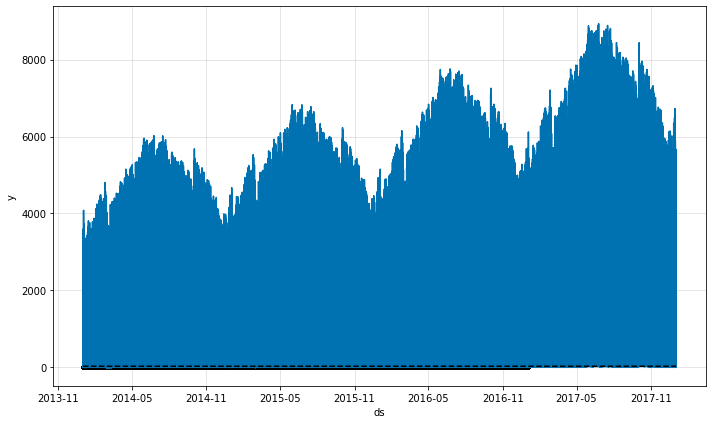

In [58]:
model.plot(forcasts)
forcasts.tail()


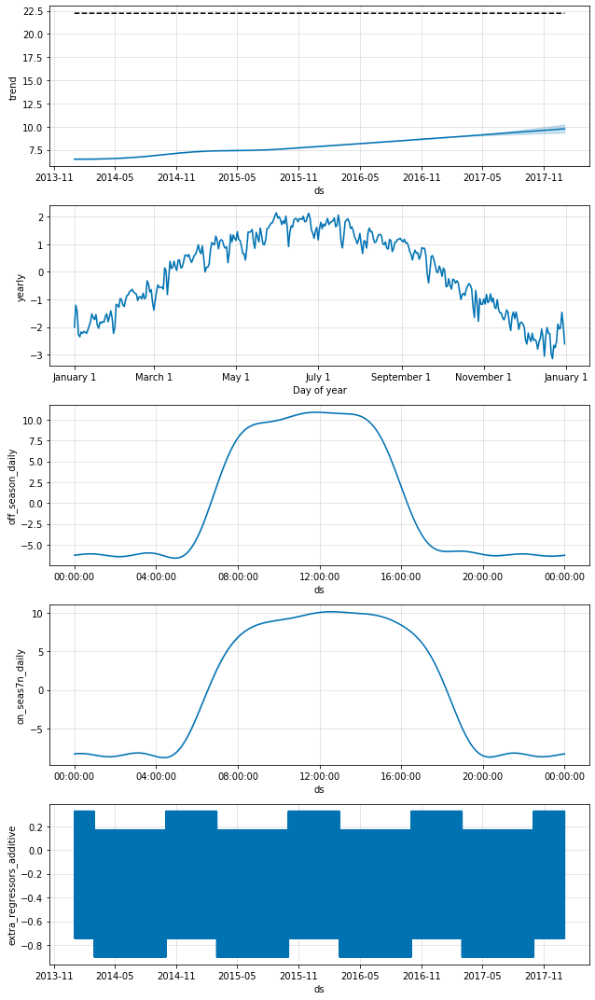

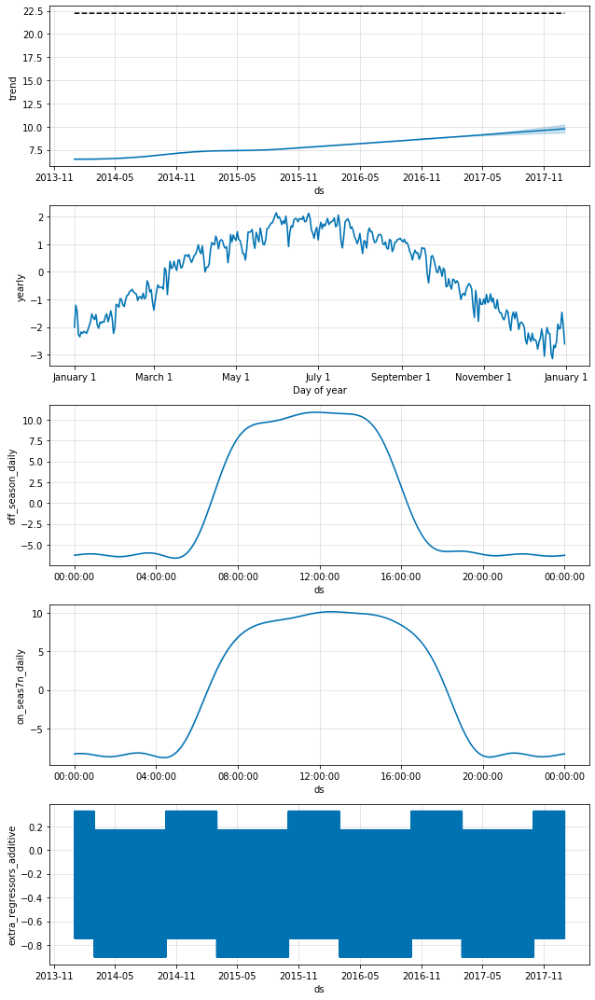

In [54]:
model.plot_components(forcasts)

In [55]:
#dd_s['y'] = np.exp(dd['y'])
dd_s['y'] = (dd_s['y'])**3
#dd_s_train['y'] = np.exp(dd_s_train['y'])
dd_s_train['y'] = (dd_s_train['y'])**3
#forcasts['yhst'] = np.exp(forcast['yhat'])
forcasts['yhat'] = (forcasts['yhat'])**3
dd_s_test = dd_s.loc[dd_s['ds']>pd.to_datetime('01/01/2017')]

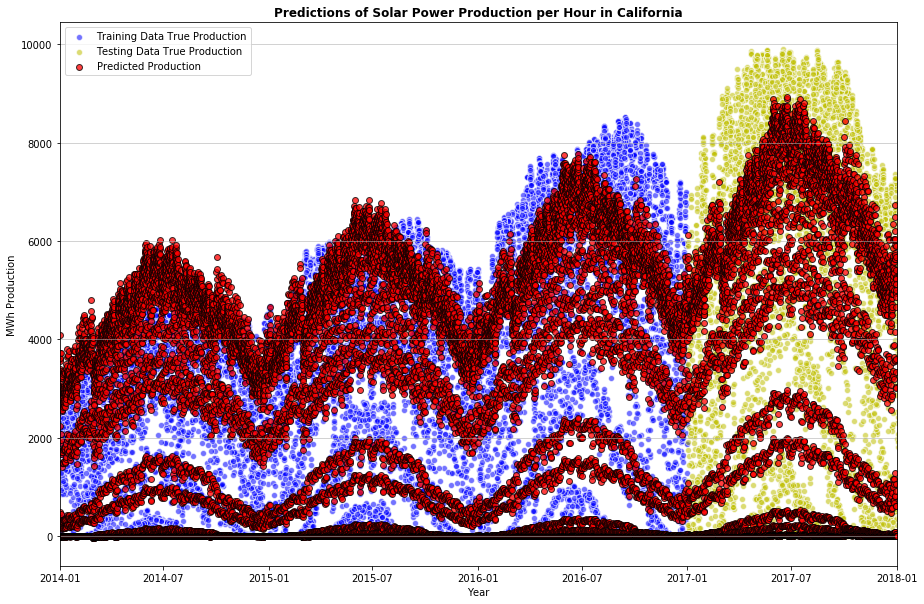

In [56]:

plt.figure(figsize=(15,10))

plt.scatter(dd_s_train['ds'],dd_s_train['y'], color='b',alpha=.55,edgecolor='w',label='Training Data True Production')
plt.scatter(dd_s_test['ds'],dd_s_test['y'],color='y',alpha=.55,edgecolor='w',label='Testing Data True Production')
plt.scatter(forcasts['ds'],forcasts['yhat'],color='r',alpha=.75,edgecolor='k',label='Predicted Production')

plt.xlim(pd.to_datetime('01/01/2014'),pd.to_datetime('01/01/2018'))
plt.ylabel('MWh Production')
plt.xlabel('Year')
plt.legend()
plt.grid(axis='y',alpha=.7)
#plt.ylim(bottom=0,top =300000)
plt.title("Predictions of Solar Power Production per Hour in California",fontweight='bold')
plt.show()

Predicted total solar Production 2017:  21531.0
True total solar Production 2017:  25270.0
Error in year total prediction in GWh:  -3739.0


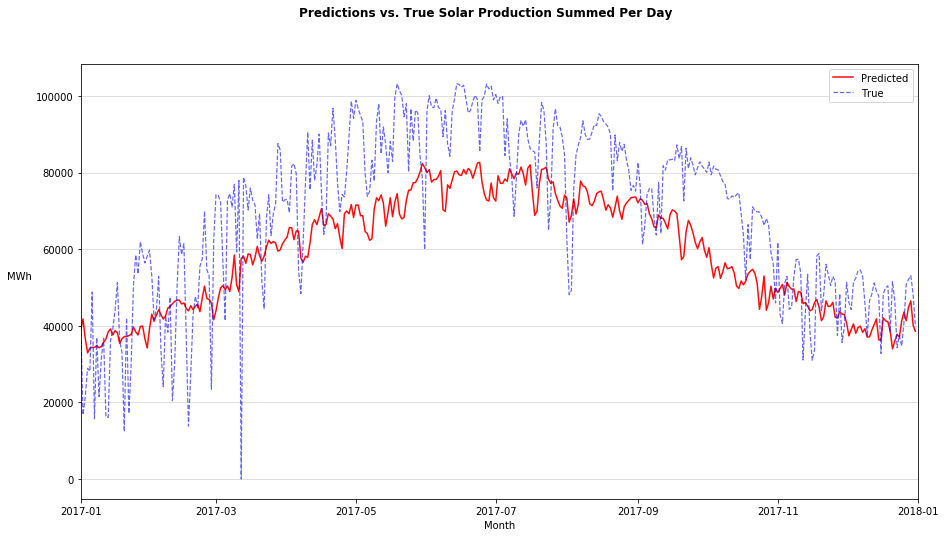

Test MAPE:  inf
Train R2:  0.9199092315085621
Test MAPE:  inf
Test R2:  0.9018619654584055


C:\Users\graha\Anaconda3\lib\site-packages\ipykernel_launcher.py:57: RuntimeWarning:

divide by zero encountered in double_scalars

C:\Users\graha\Anaconda3\lib\site-packages\ipykernel_launcher.py:68: RuntimeWarning:

divide by zero encountered in double_scalars

C:\Users\graha\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning:

overflow encountered in reduce



In [57]:
yhats = pd.DataFrame(forcasts.loc[((forcasts['ds'] >= pd.to_datetime('01/01/2017')) & (forcasts['ds'] < pd.to_datetime('01/01/2018'))),['yhat','ds']])
trues = pd.DataFrame(dd_s.loc[((dd_s['ds'] >= pd.to_datetime('01/01/2017')) & (dd_s['ds'] < pd.to_datetime('01/01/2018'))),['y','ds']])

testers = pd.merge(yhats.set_index(pd.DatetimeIndex(yhats['ds'])),(trues.set_index(pd.DatetimeIndex(trues['ds']))),how='left',left_index=True,right_index=True)
#display(tester.head())

print('Predicted total solar Production 2017: ',(testers['yhat'].sum())//1000)
print('True total solar Production 2017: ',testers['y'].sum()//1000)
print('Error in year total prediction in GWh: ', (testers['yhat'].sum()-testers['y'].sum())//1000)


datafs = forcasts.loc[((forcasts['ds'] >= pd.to_datetime('01/01/2017')) & (forcasts['ds'] < pd.to_datetime('01/01/2018'))),:].set_index(pd.DatetimeIndex(forcasts.loc[((forcasts['ds'] >= pd.to_datetime('01/01/2017')) & (forcasts['ds'] < pd.to_datetime('01/01/2018'))),'ds'])).resample('24H').sum().loc[:,'yhat'].values
datats = dd_s.loc[((dd_s['ds'] >= pd.to_datetime('01/01/2017')) & (dd_s['ds'] < pd.to_datetime('01/01/2018'))),:].set_index(pd.DatetimeIndex(dd_s.loc[((dd_s['ds'] >= pd.to_datetime('01/01/2017')) & (dd_s['ds'] < pd.to_datetime('01/01/2018'))),'ds'])).resample('24H').sum().loc[:,'y'].values
months = ['Jan','Feb','Mar','Apr','May','June','Jul','Aug','Sep','Oct','Nov','Dec']    

#dataf = np.array(dataf).reshape(-1,1)
#datat = np.array(dataf).reshape(-1,1)

predicted = []
trues = []

#for month in set(forcast.loc[((forcast['ds'] >= pd.to_datetime('01/01/2017')) & (forcast['ds'] < pd.to_datetime('01/01/2018'))),'ds'].dt.month):
#    yhat = dataf.loc[dataf['ds'].dt.month == month, 'yhat'].values
#    true = datat.loc[datat['ds'].dt.month == month, 'y'].values
#   #print('Predicted Total Renewable Production {}, 2017: {}'.format(months[month-1],sum(yhat)//1000))
#    #print('True Total Renewable Production {}, 2017: {}'.format(months[month-1],sum(true)//1000))
#    #print('Error in GWh: {}\n\n'.format((sum(yhat)-sum(true))//1000))
#    predicted.append(sum(yhat)//1000)
#    trues.append(sum(true)//1000)

month_list = pd.date_range('01/01/2017','12/31/2017 23:00:00',freq='24H')


plt.figure(figsize=(15,8))
plt.plot(month_list,datafs,label='Predicted',linewidth=1.5,alpha=.95,color='r')
plt.plot(month_list,datats,label='True',linewidth=1.2, alpha=.6,color='b',ls='--')
plt.legend()
plt.suptitle('Predictions vs. True Solar Production Summed Per Day',fontweight='bold')
plt.xlabel('Month')
plt.ylabel('MWh',rotation='0',ha='right')
plt.grid(axis='y',alpha=.5)
plt.xlim(pd.to_datetime('01/01/2017'),pd.to_datetime('01/01/2018'))
#plt.ylim(bottom=75000,top=260000)
plt.show()

yhat_trains = pd.DataFrame(forcasts.loc[((forcasts['ds'] >= pd.to_datetime('01/01/2014')) & (forcasts['ds'] < pd.to_datetime('01/01/2017'))),['yhat','ds']])
true_trains = pd.DataFrame(dd_s.loc[((dd_s['ds'] >= pd.to_datetime('01/01/2014')) & (dd_s['ds'] < pd.to_datetime('01/01/2017'))),['y','ds']])

tester_trains = pd.merge(yhat_trains.set_index(pd.DatetimeIndex(yhat_trains['ds'])),(true_trains.set_index(pd.DatetimeIndex(true_trains['ds']))),how='left',left_index=True,right_index=True)


tester_trains['msem'] = ((tester_trains['y']-tester_trains['yhat'])**2)
tester_trains['mseb'] = (tester_trains['y']-tester_trains['y'].mean())**2
r2 = 1 - ((np.sum(tester_trains['msem'])/len(tester_trains))/(np.sum(tester_trains['mseb'])/len(tester_trains)))
true_trains = tester_trains['y'].values
yhat_trains = tester_trains['yhat'].values
mape = np.sum(list(map((lambda true,yhat : np.abs((true - yhat)/true)),true_trains,yhat_trains)))*(100/len(true_trains))
print('Test MAPE: ', mape)
print('Train R2: ',r2)
    


testers['msem'] = ((testers['y']-testers['yhat'])**2)
testers['mseb'] = (testers['y']-testers['y'].mean())**2
r2 = 1 - ((np.sum(testers['msem'])/len(testers))/(np.sum(testers['mseb'])/len(testers)))
true_tests = testers['y'].values
yhat_tests = testers['yhat'].values
mape2 = (np.sum(np.nan_to_num(np.array(list(map((lambda true,yhat : (np.abs(true - yhat)/true)),true_tests,yhat_tests)))))*100)/len(true_tests)
print('Test MAPE: ', mape2)

print('Test R2: ',r2)


### Taking above solar predictions and adding them to the total renewable's model 
##### Something is currently off with the 'on_season_daily' trend, should be very similar to 'off_season_daily' like in above models
###### Adding in solar predictions as extra regressor seemed to help capture the increased growth into the future.  

In [116]:
 
full_data = full_data.set_index(pd.DatetimeIndex(full_data['TIMESTAMP']))

y = full_data['RENEW TOTAL']
#daily_renew = y.resample('4H').sum()
daily_renew = y
dd = pd.DataFrame(daily_renew).reset_index()


def on_seasonr(ds):
    date = pd.to_datetime(ds)
    if ((date.month >= 3) & (date.month <= 9)):
        return 1
    else:
        return 0

def on_season(ds):
    date = pd.to_datetime(ds)
    return ((date.month > 3) & (date.month < 11))

def daytime(ds):
    date = pd.to_datetime(ds)
    if ((date.hour <= 7)|(date.hour > 19)):
        return -1
    elif date.hour <= 11:
        return 0
    elif date.hour <=16:
        return 2
    elif date.hour <=19:
        return 0
    
def equinox(ds):
    date = pd.to_datetime(ds)
    if ((date <= pd.to_datetime('03-20-{}'.format(date.year))) & (date >= pd.to_datetime('02-01-{}'.format(date.year)))):
        return 0
    elif date <= pd.to_datetime('06-20-{}'.format(date.year)):
        return 2
    elif date <= pd.to_datetime('09-22-{}'.format(date.year)):
        return 2
    elif date <= pd.to_datetime('12-01-{}'.format(date.year)):
        return 0
    else:
        return -1
def get_year(ds):
    date = pd.to_datetime(ds)
    if date.year <= 2014:
        return -2
    elif date.year <= 2015:
        return -1
    elif date.year <= 2016:
        return 0
    elif date.year <= 2017:
        return 1
    elif date.year <= 2018:
        return 2


dd.columns = ['ds','y']
dd= dd.loc[dd['ds'].dt.year >= 2014,:]
dd_sm = forcasts.loc[:,['ds','yhat']]

dd = pd.merge(dd.set_index(pd.DatetimeIndex(dd['ds'])),(dd_sm.set_index(pd.DatetimeIndex(dd_sm['ds']))),how='left',left_index=True,right_index=True)
dd = dd.reset_index()
dd.drop(columns=['ds_x','ds_y'],inplace=True)
dd.columns = ['ds','y','solar']
display(dd.head())


scaler = StandardScaler()

dd['cap'] = 17000
dd['cap'] = np.log(dd['cap'])

dd['on_season'] = dd['ds'].apply(on_season)
dd['off_season'] = ~dd['ds'].apply(on_season)
dd['daytime'] = dd['ds'].apply(daytime)
#dd['equinox'] = dd['ds'].apply(equinox)
dd['on_seasonr'] = dd['ds'].apply(on_seasonr)
#dd['year'] = dd['ds'].apply(get_year)
dd['y'] = dd['y'].replace(0,dd['y'].median())
#dd['y'] = np.cbrt(dd['y'])
#dd['y'] = 1/np.sqrt(dd['y'])
dd['y'] = np.log(dd['y'])
#dd['y'] = 1/np.sqrt(dd['y'])

#on_seasonv = dd['on_seasonr'].values
#on_seasonv = on_seasonv.reshape(-1,1)

#equinoxv = dd['equinox'].values
#equinoxv = equinoxv.reshape(-1,1)

daytimev = dd['daytime'].values
daytimev = daytimev.reshape(-1,1)

solarv = dd['solar'].values
solarv = solarv.reshape(-1,1)

#yearv = dd['year'].values
#yearv = yearv.reshape(-1,1)

#dd['year'] = scaler.fit_transform(yearv)
#dd['equinox'] =  scaler.fit_transform(equinoxv)
dd['daytime'] = scaler.fit_transform(daytimev)
dd['solar'] = scaler.fit_transform(solarv)

dd_train = pd.DataFrame(dd.loc[((dd['ds'] >= pd.to_datetime('01/01/2014'))&(dd['ds'] < pd.to_datetime('01/01/2017')))])


display(dd_train.head(8))
print(y.iloc[0:5].sum())
print(y.iloc[5:8].sum())
dd_train.info()

,ds,y,solar
0,2017-06-12 00:00:00,4854.0,20.094097
1,2017-06-12 01:00:00,5037.0,17.018935
2,2017-06-12 02:00:00,5067.0,14.094123
3,2017-06-12 03:00:00,4742.0,23.579533
4,2017-06-12 04:00:00,5093.0,14.218702


,ds,y,solar,cap,on_season,off_season,daytime,on_seasonr
48,2015-09-28 00:00:00,8.242493,-0.791065,9.740969,True,False,-0.795932,1
49,2015-09-28 01:00:00,8.252185,-0.791143,9.740969,True,False,-0.795932,1
50,2015-09-28 02:00:00,8.206038,-0.791271,9.740969,True,False,-0.795932,1
51,2015-09-28 03:00:00,8.245384,-0.791028,9.740969,True,False,-0.795932,1
52,2015-09-28 04:00:00,8.216628,-0.791282,9.740969,True,False,-0.795932,1
53,2015-09-28 05:00:00,8.137396,-0.791010,9.740969,True,False,-0.795932,1
54,2015-09-28 06:00:00,8.128585,-0.758804,9.740969,True,False,-0.795932,1
55,2015-09-28 07:00:00,8.288283,-0.317267,9.740969,True,False,-0.795932,1


20634.0
11754.0
<class 'pandas.core.frame.DataFrame'>
Int64Index: 26232 entries, 48 to 35327
Data columns (total 8 columns):
ds            26232 non-null datetime64[ns]
y             26232 non-null float64
solar         26232 non-null float64
cap           26232 non-null float64
on_season     26232 non-null bool
off_season    26232 non-null bool
daytime       26232 non-null float64
on_seasonr    26232 non-null int64
dtypes: bool(2), datetime64[ns](1), float64(4), int64(1)
memory usage: 1.5 MB


In [117]:
model = Prophet(changepoint_range=.25,weekly_seasonality=False,daily_seasonality=False,yearly_seasonality=150,
               growth='logistic',changepoint_prior_scale=0.52)
#model.add_seasonality(name='monthly',period=30.5, fourier_order=3)
model.add_seasonality(name='on_season_daily',period=1,condition_name='on_season', fourier_order=4)
model.add_seasonality(name='off_season_daily',period=1,condition_name='off_season', fourier_order=6)
#model.add_seasonality(name='equinox',period=365//4,fourier_order=10//4)
model.add_regressor('daytime')
model.add_regressor('solar')
model.add_regressor('on_seasonr')
#model.add_regressor('year')
model.fit(dd_train)



In [118]:
future = model.make_future_dataframe(periods=365*24,freq='1H')

dd_smf = dd[['ds','solar']]

future = pd.merge(future.set_index(pd.DatetimeIndex(future['ds'])),(dd_smf.set_index(pd.DatetimeIndex(dd_smf['ds']))),how='left',left_index=True,right_index=True)
future = future.reset_index()
future.drop(columns=['ds_x','ds_y'],inplace=True)
future = future.dropna()
future.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 34968 entries, 0 to 34991
Data columns (total 2 columns):
ds       34968 non-null datetime64[ns]
solar    34968 non-null float64
dtypes: datetime64[ns](1), float64(1)
memory usage: 819.6 KB


In [119]:





future['on_season'] = future['ds'].apply(on_season)
#future['equinox'] = future['ds'].apply(equinox)
future['off_season'] = ~future['ds'].apply(on_season)
future['daytime'] = future['ds'].apply(daytime)
future['on_seasonr'] = future['ds'].apply(on_seasonr)
#future['year'] = future['ds'].apply(get_year)
future['cap'] = 16200
future['cap'] = np.log(future['cap'])

#yearf = future['on_season'].values
#yearf = yearf.reshape(-1,1)

#equinoxf = future['equinox'].values
#equinoxf = equinoxf.reshape(-1,1)

daytimef = future['daytime'].values
daytimef = daytimef.reshape(-1,1)



#future['year'] = scaler.fit_transform(yearf)
#future['equinox'] = scaler.fit_transform(equinoxf)
future['daytime'] = scaler.fit_transform(daytimef)

display(future.head())


,ds,solar,on_season,off_season,daytime,on_seasonr,cap
0,2014-01-01 00:00:00,-0.792857,False,True,-0.795932,0,9.692767
1,2014-01-01 01:00:00,-0.792309,False,True,-0.795932,0,9.692767
2,2014-01-01 02:00:00,-0.793135,False,True,-0.795932,0,9.692767
3,2014-01-01 03:00:00,-0.792290,False,True,-0.795932,0,9.692767
4,2014-01-01 04:00:00,-0.791964,False,True,-0.795932,0,9.692767


In [120]:
forcast = model.predict(future)

,ds,trend,cap,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,...,solar,solar_lower,solar_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
34963,2017-12-31 19:00:00,8.704151,9.692767,7.917838,8.422685,8.629241,8.777504,-0.535800,-0.535800,-0.535800,...,-0.182247,-0.182247,-0.182247,-0.266085,-0.266085,-0.266085,0.0,0.0,0.0,8.168352
34964,2017-12-31 20:00:00,8.704157,9.692767,7.896598,8.402973,8.629229,8.777530,-0.547993,-0.547993,-0.547993,...,-0.182253,-0.182253,-0.182253,-0.272538,-0.272538,-0.272538,0.0,0.0,0.0,8.156164
34965,2017-12-31 21:00:00,8.704162,9.692767,7.885635,8.394808,8.629217,8.777556,-0.564169,-0.564169,-0.564169,...,-0.182307,-0.182307,-0.182307,-0.279055,-0.279055,-0.279055,0.0,0.0,0.0,8.139993
34966,2017-12-31 22:00:00,8.704168,9.692767,7.853636,8.367269,8.629205,8.777582,-0.577250,-0.577250,-0.577250,...,-0.182148,-0.182148,-0.182148,-0.285608,-0.285608,-0.285608,0.0,0.0,0.0,8.126918
34967,2017-12-31 23:00:00,8.704173,9.692767,7.857157,8.369975,8.629193,8.777608,-0.586336,-0.586336,-0.586336,...,-0.182305,-0.182305,-0.182305,-0.292173,-0.292173,-0.292173,0.0,0.0,0.0,8.117837


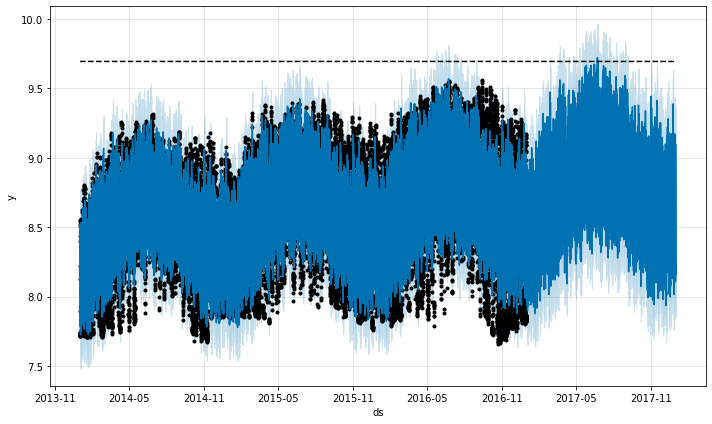

In [121]:
model.plot(forcast)
forcast.tail()

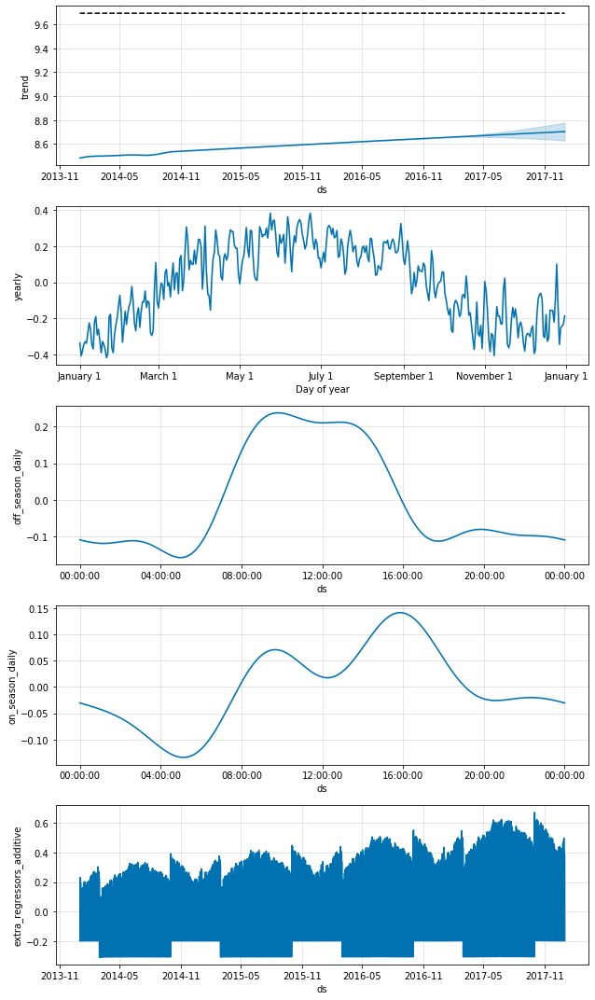

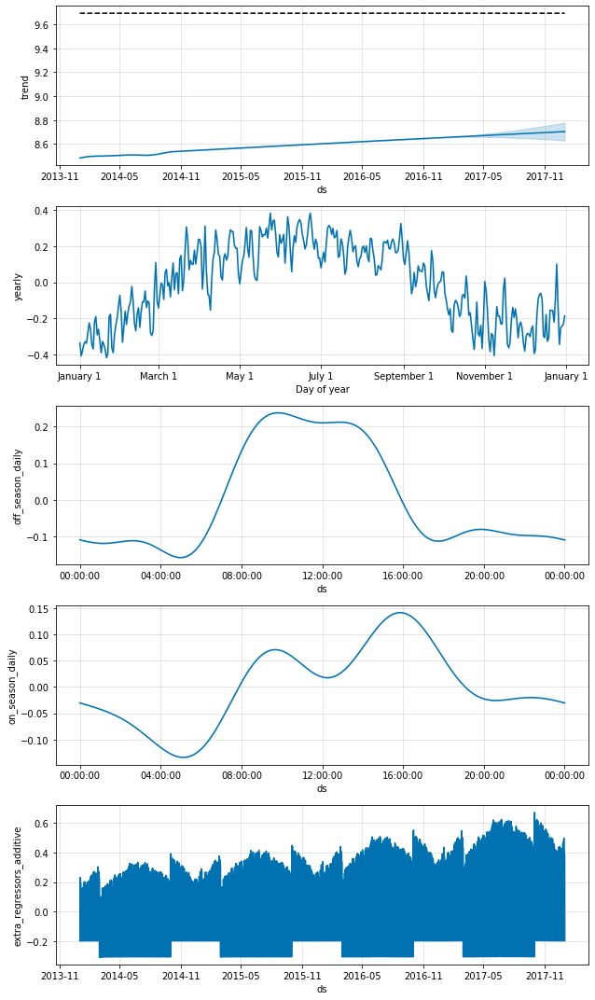

In [122]:
model.plot_components(forcast)

In [123]:
dd['y'] = np.exp(dd['y'])
#dd['y'] = (dd['y'])**3
dd_train['y'] = np.exp(dd_train['y'])
#dd_train['y'] = (dd_train['y'])**3
forcast['yhat'] = np.exp(forcast['yhat'])
#forcast['yhat'] = (forcast['yhat'])**3
dd_test = dd.loc[dd['ds']>pd.to_datetime('01/01/2017')]

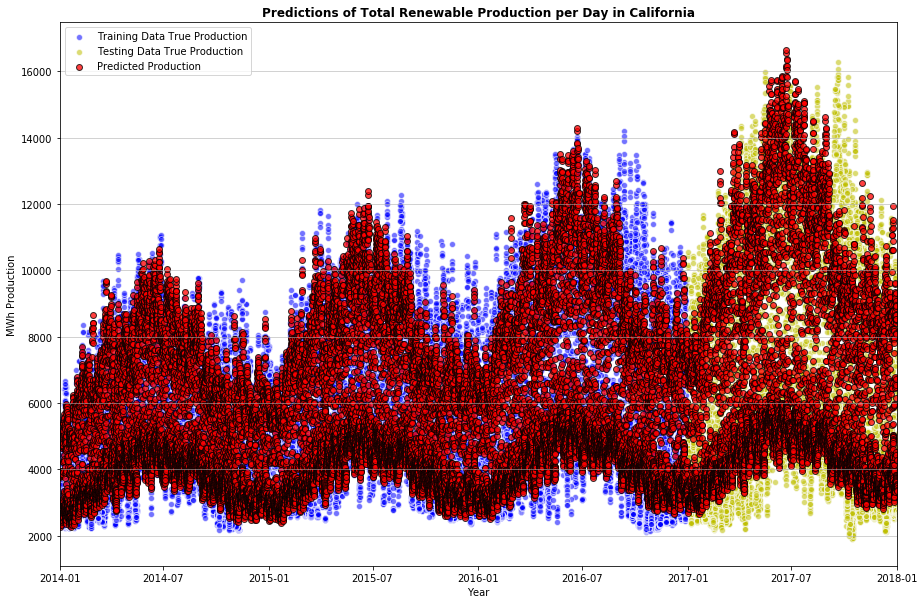

In [124]:

plt.figure(figsize=(15,10))

plt.scatter(dd_train['ds'],dd_train['y'], color='b',alpha=.55,edgecolor='w',label='Training Data True Production')
plt.scatter(dd_test['ds'],dd_test['y'],color='y',alpha=.55,edgecolor='w',label='Testing Data True Production')
plt.scatter(forcast['ds'],forcast['yhat'],color='r',alpha=.75,edgecolor='k',label='Predicted Production')

plt.xlim(pd.to_datetime('01/01/2014'),pd.to_datetime('01/01/2018'))
plt.ylabel('MWh Production')
plt.xlabel('Year')
plt.legend()
plt.grid(axis='y',alpha=.7)
#plt.ylim(bottom=0,top =300000)
plt.title("Predictions of Total Renewable Production per Day in California",fontweight='bold')
plt.show()

Predicted Total Renewable Production 2017:  57377.0
True Total Renewable Production 2017:  59751.0
Error in year total prediction in GWh:  -2375.0


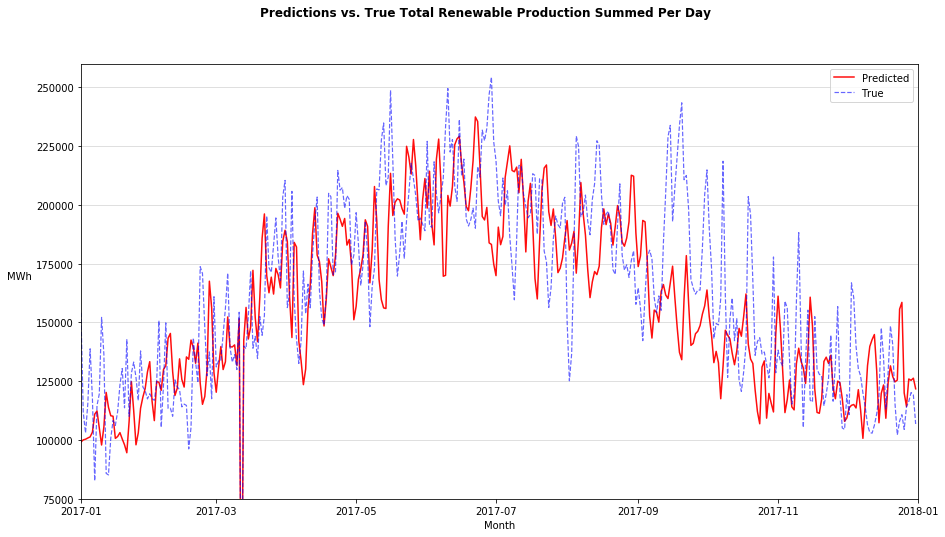

Test MAPE:  15.17334518838315
Train R2:  0.8122313086763521
Test MAPE:  20.439601031685203
Test R2:  0.7915679548071207


In [125]:
yhat = pd.DataFrame(forcast.loc[((forcast['ds'] >= pd.to_datetime('01/01/2017')) & (forcast['ds'] < pd.to_datetime('01/01/2018'))),['yhat','ds']])
true = pd.DataFrame(dd.loc[((dd['ds'] >= pd.to_datetime('01/01/2017')) & (dd['ds'] < pd.to_datetime('01/01/2018'))),['y','ds']])

tester = pd.merge(yhat.set_index(pd.DatetimeIndex(yhat['ds'])),(true.set_index(pd.DatetimeIndex(true['ds']))),how='left',left_index=True,right_index=True)
#display(tester.head())

print('Predicted Total Renewable Production 2017: ',(tester['yhat'].sum())//1000)
print('True Total Renewable Production 2017: ',tester['y'].sum()//1000)
print('Error in year total prediction in GWh: ', (tester['yhat'].sum()-tester['y'].sum())//1000)


dataf = forcast.loc[((forcast['ds'] >= pd.to_datetime('01/01/2017')) & (forcast['ds'] < pd.to_datetime('01/01/2018'))),:].set_index(pd.DatetimeIndex(forcast.loc[((forcast['ds'] >= pd.to_datetime('01/01/2017')) & (forcast['ds'] < pd.to_datetime('01/01/2018'))),'ds'])).resample('24H').sum().loc[:,'yhat'].values
datat = dd.loc[((dd['ds'] >= pd.to_datetime('01/01/2017')) & (dd['ds'] < pd.to_datetime('01/01/2018'))),:].set_index(pd.DatetimeIndex(dd.loc[((dd['ds'] >= pd.to_datetime('01/01/2017')) & (dd['ds'] < pd.to_datetime('01/01/2018'))),'ds'])).resample('24H').sum().loc[:,'y'].values
months = ['Jan','Feb','Mar','Apr','May','June','Jul','Aug','Sep','Oct','Nov','Dec']    



month_list = pd.date_range('01/01/2017','12/31/2017 23:00:00',freq='24H')


plt.figure(figsize=(15,8))
plt.plot(month_list,dataf,label='Predicted',linewidth=1.5,alpha=.95,color='r')
plt.plot(month_list,datat,label='True',linewidth=1.2, alpha=.6,color='b',ls='--')
plt.legend()
plt.suptitle('Predictions vs. True Total Renewable Production Summed Per Day',fontweight='bold')
plt.xlabel('Month')
plt.ylabel('MWh',rotation='0',ha='right')
plt.grid(axis='y',alpha=.5)
plt.xlim(pd.to_datetime('01/01/2017'),pd.to_datetime('01/01/2018'))
plt.ylim(bottom=75000,top=260000)
plt.show()

yhat_train = pd.DataFrame(forcast.loc[((forcast['ds'] >= pd.to_datetime('01/01/2014')) & (forcast['ds'] < pd.to_datetime('01/01/2017'))),['yhat','ds']])
true_train = pd.DataFrame(dd.loc[((dd['ds'] >= pd.to_datetime('01/01/2014')) & (dd['ds'] < pd.to_datetime('01/01/2017'))),['y','ds']])

tester_train = pd.merge(yhat_train.set_index(pd.DatetimeIndex(yhat_train['ds'])),(true_train.set_index(pd.DatetimeIndex(true_train['ds']))),how='left',left_index=True,right_index=True)


tester_train['msem'] = ((tester_train['y']-tester_train['yhat'])**2)
tester_train['mseb'] = (tester_train['y']-tester_train['y'].mean())**2
r2 = 1 - ((np.sum(tester_train['msem'])/len(tester_train))/(np.sum(tester_train['mseb'])/len(tester_train)))
true_train = tester_train['y'].values
yhat_train = tester_train['yhat'].values
mape = np.sum(list(map((lambda true,yhat : np.abs((true - yhat)/true)),true_train,yhat_train)))*(100/len(true_train))
print('Test MAPE: ', mape)
print('Train R2: ',r2)
    


tester['msem'] = ((tester['y']-tester['yhat'])**2)
tester['mseb'] = (tester['y']-tester['y'].mean())**2
r2 = 1 - ((np.sum(tester['msem'])/len(tester))/(np.sum(tester['mseb'])/len(tester)))
true_test = tester['y'].values
yhat_test = tester['yhat'].values
mape2 = (np.sum(np.nan_to_num(np.array(list(map((lambda true,yhat : (np.abs(true - yhat)/true)),true_test,yhat_test)))))*100)/len(true_test)
print('Test MAPE: ', mape2)

print('Test R2: ',r2)


## Now fitting to wind to see if adding that in as an extra regressor could help add to the total renewable accuracy

###### As seen at the bottom, wind's production is very unreliable.  Need to do a lot of changing to the way I fit the data to improve it.  For now just staying with solar as extra regressor in total renewable produciton

In [42]:
full_data = full_data.set_index(pd.DatetimeIndex(full_data['TIMESTAMP']))

y = full_data['WIND TOTAL']
#daily_renew = y.resample('4H').sum()
daily_renew = y
dd_w = pd.DataFrame(daily_renew).reset_index()


def on_seasonr(ds):
    date = pd.to_datetime(ds)
    if ((date.month >= 3) & (date.month <= 9)):
        return 1
    else:
        return 0

def on_season(ds):
    date = pd.to_datetime(ds)
    return ((date.month >= 3) & (date.month <= 9))

def daytimew(ds):
    date = pd.to_datetime(ds)
    if ((date.hour <= 5)|(date.hour >= 19)):
        return 2
    elif date.hour <= 9:
        return 0
    elif date.hour <=14:
        return -1
    elif date.hour <=18:
        return 0



dd_w.columns = ['ds','y']

scaler = StandardScaler()

dd_w['cap'] = np.cbrt(5800)
#dd_s['cap'] = np.log(dd['cap'])

dd_w['on_season'] = dd_w['ds'].apply(on_season)
dd_w['off_season'] = ~dd_w['ds'].apply(on_season)
dd_w['daytime'] = dd_w['ds'].apply(daytimew)
#dd['equinox'] = dd['ds'].apply(equinox)
dd_w['on_seasonr'] = dd_w['ds'].apply(on_seasonr)
#dd['year'] = dd['ds'].apply(get_year)
#dd['y'] = dd['y'].replace(0,dd['y'].median())
dd_w['y'] = np.cbrt(dd_w['y'])
#dd['y'] = 1/np.sqrt(dd['y'])
#dd_s['y'] = np.log(dd_s['y'])
#dd['y'] = 1/np.sqrt(dd['y'])

#on_seasonv = dd['on_season'].values
#on_seasonv = on_seasonv.reshape(-1,1)

#equinoxv = dd['equinox'].values
#equinoxv = equinoxv.reshape(-1,1)

daytimev = dd_w['daytime'].values
daytimev = daytimev.reshape(-1,1)

#yearv = dd['year'].values
#yearv = yearv.reshape(-1,1)

#dd['year'] = scaler.fit_transform(yearv)
#dd['equinox'] =  scaler.fit_transform(equinoxv)
dd_w['daytime'] = scaler.fit_transform(daytimev)

dd_w_train = pd.DataFrame(dd_w.loc[((dd_w['ds'] >= pd.to_datetime('01/01/2014'))&(dd_w['ds'] < pd.to_datetime('01/01/2017')))])


display(dd_w_train.head(8))

dd_w_train.info()

,ds,y,cap,on_season,off_season,daytime,on_seasonr
144,2015-09-28 00:00:00,10.360203,17.967018,True,False,1.040878,1
145,2015-09-28 01:00:00,10.473858,17.967018,True,False,1.040878,1
146,2015-09-28 02:00:00,9.919351,17.967018,True,False,1.040878,1
147,2015-09-28 03:00:00,10.397337,17.967018,True,False,1.040878,1
148,2015-09-28 04:00:00,10.160736,17.967018,True,False,1.040878,1
149,2015-09-28 05:00:00,9.446607,17.967018,True,False,1.040878,1
150,2015-09-28 06:00:00,9.294767,17.967018,True,False,-0.570804,1
151,2015-09-28 07:00:00,9.121801,17.967018,True,False,-0.570804,1


<class 'pandas.core.frame.DataFrame'>
Int64Index: 26232 entries, 144 to 67535
Data columns (total 7 columns):
ds            26232 non-null datetime64[ns]
y             26232 non-null float64
cap           26232 non-null float64
on_season     26232 non-null bool
off_season    26232 non-null bool
daytime       26232 non-null float64
on_seasonr    26232 non-null int64
dtypes: bool(2), datetime64[ns](1), float64(3), int64(1)
memory usage: 1.3 MB


In [43]:
model = Prophet(changepoint_range=.65,weekly_seasonality=False,daily_seasonality=False,yearly_seasonality=150,
               growth='logistic')
model.add_seasonality(name='monthly',period=30.5, fourier_order=20)
model.add_seasonality(name='on_season_daily',period=1,condition_name='on_season', fourier_order=6)
model.add_seasonality(name='off_season_daily',period=1,condition_name='off_season', fourier_order=6)
#model.add_seasonality(name='equinox',period=365//4,fourier_order=10//4)
model.add_regressor('daytime')
#model.add_regressor('equinox')
model.add_regressor('on_seasonr')
#model.add_regressor('year')
model.fit(dd_w_train)


In [44]:
futurew = model.make_future_dataframe(periods=365*24,freq='1H')
futurew['on_season'] = futurew['ds'].apply(on_season)
#future['equinox'] = future['ds'].apply(equinox)
futurew['off_season'] = ~futurew['ds'].apply(on_season)
futurew['daytime'] = futurew['ds'].apply(daytimew)
futurew['on_seasonr'] = futurew['ds'].apply(on_seasonr)
#future['year'] = future['ds'].apply(get_year)
futurew['cap'] = np.cbrt(5800)
#futures['cap'] = np.log(future['cap'])

#yearf = future['on_season'].values
#yearf = yearf.reshape(-1,1)

#equinoxf = future['equinox'].values
#equinoxf = equinoxf.reshape(-1,1)

daytimef = futurew['daytime'].values
daytimef = daytimef.reshape(-1,1)

#future['year'] = scaler.fit_transform(yearf)
#future['equinox'] = scaler.fit_transform(equinoxf)
futurew['daytime'] = scaler.fit_transform(daytimef)

forcastw = model.predict(futurew)

,ds,trend,cap,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,...,on_seasonr,on_seasonr_lower,on_seasonr_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2014-01-01 00:00:00,10.701372,17.967018,3.913349,10.065951,10.701372,10.701372,-3.562282,-3.562282,-3.562282,...,0.0,0.0,0.0,-4.620081,-4.620081,-4.620081,0.0,0.0,0.0,7.139090
1,2014-01-01 01:00:00,10.701417,17.967018,3.787501,9.789154,10.701417,10.701417,-3.693172,-3.693172,-3.693172,...,0.0,0.0,0.0,-4.781084,-4.781084,-4.781084,0.0,0.0,0.0,7.008245
2,2014-01-01 02:00:00,10.701463,17.967018,3.884375,9.854659,10.701463,10.701463,-3.777395,-3.777395,-3.777395,...,0.0,0.0,0.0,-4.940931,-4.940931,-4.940931,0.0,0.0,0.0,6.924068
3,2014-01-01 03:00:00,10.701508,17.967018,3.503000,9.923672,10.701508,10.701508,-4.003892,-4.003892,-4.003892,...,0.0,0.0,0.0,-5.098994,-5.098994,-5.098994,0.0,0.0,0.0,6.697617
4,2014-01-01 04:00:00,10.701554,17.967018,3.352311,9.183832,10.701554,10.701554,-4.323467,-4.323467,-4.323467,...,0.0,0.0,0.0,-5.254658,-5.254658,-5.254658,0.0,0.0,0.0,6.378087


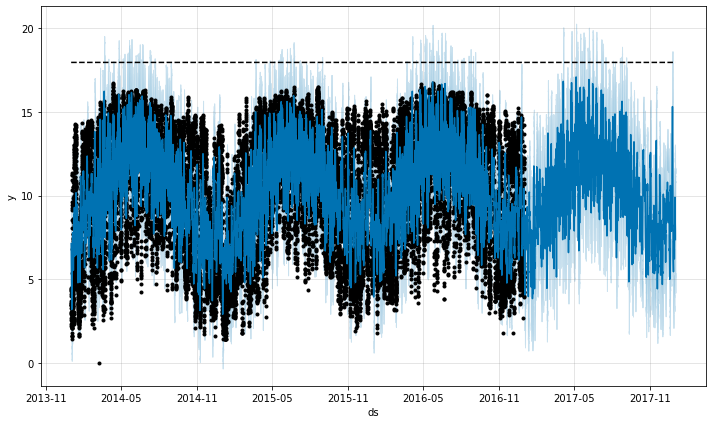

In [45]:
model.plot(forcastw)
forcastw.head()

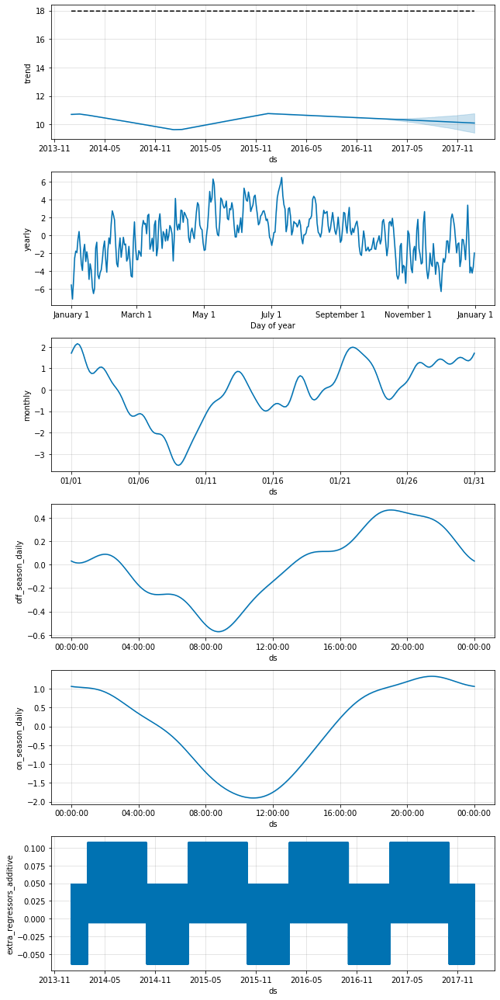

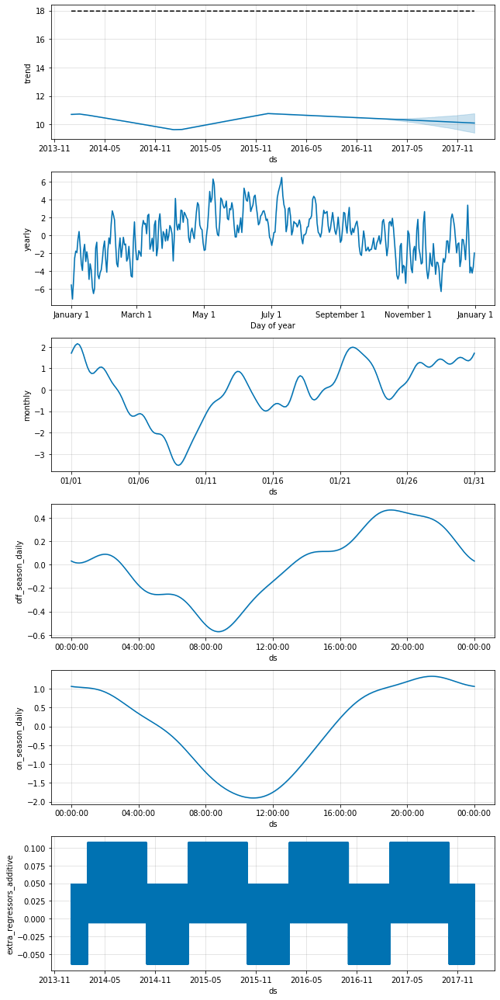

In [46]:
model.plot_components(forcastw)

In [47]:
#dd_s['y'] = np.exp(dd['y'])
dd_w['y'] = (dd_w['y'])**3
#dd_s_train['y'] = np.exp(dd_s_train['y'])
dd_w_train['y'] = (dd_w_train['y'])**3
#forcasts['yhst'] = np.exp(forcast['yhat'])
forcastw['yhat'] = (forcastw['yhat'])**3
dd_w_test = dd_w.loc[dd_w['ds']>pd.to_datetime('01/01/2017')]

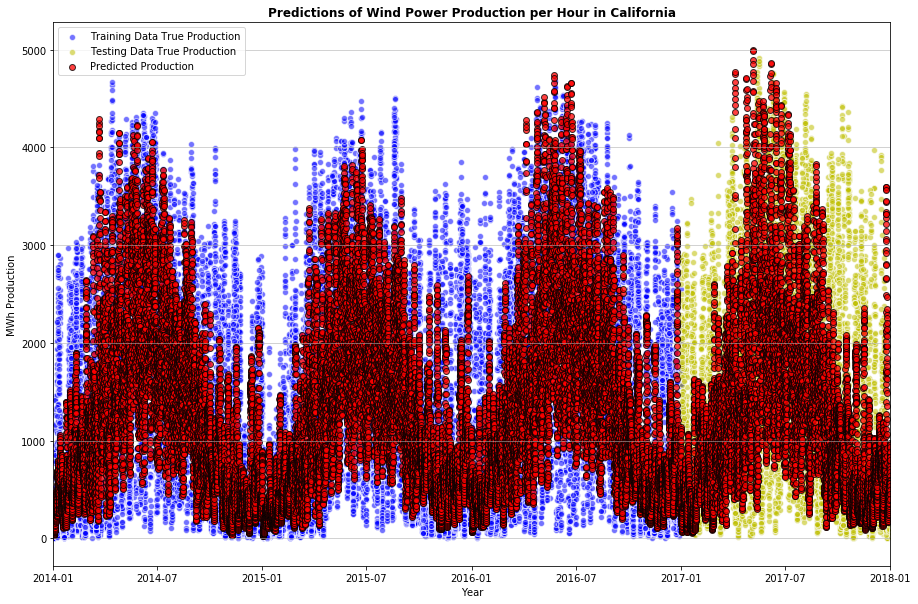

In [48]:

plt.figure(figsize=(15,10))

plt.scatter(dd_w_train['ds'],dd_w_train['y'], color='b',alpha=.55,edgecolor='w',label='Training Data True Production')
plt.scatter(dd_w_test['ds'],dd_w_test['y'],color='y',alpha=.55,edgecolor='w',label='Testing Data True Production')
plt.scatter(forcastw['ds'],forcastw['yhat'],color='r',alpha=.75,edgecolor='k',label='Predicted Production')

plt.xlim(pd.to_datetime('01/01/2014'),pd.to_datetime('01/01/2018'))
plt.ylabel('MWh Production')
plt.xlabel('Year')
plt.legend()
plt.grid(axis='y',alpha=.7)
#plt.ylim(bottom=0,top =300000)
plt.title("Predictions of Wind Power Production per Hour in California",fontweight='bold')
plt.show()

,yhat,ds_x,y,ds_y
ds,,,,
2017-01-01 00:00:00,294.988498,2017-01-01 00:00:00,945.0,2017-01-01 00:00:00
2017-01-01 01:00:00,283.935797,2017-01-01 01:00:00,1690.0,2017-01-01 01:00:00
2017-01-01 02:00:00,280.022031,2017-01-01 02:00:00,1890.0,2017-01-01 02:00:00
2017-01-01 03:00:00,259.244823,2017-01-01 03:00:00,2286.0,2017-01-01 03:00:00
2017-01-01 04:00:00,229.574806,2017-01-01 04:00:00,2607.0,2017-01-01 04:00:00


Predicted total wind Production 2017:  11463.0
True total wind Production 2017:  13938.0
Error in year total prediction in GWh:  -2476.0


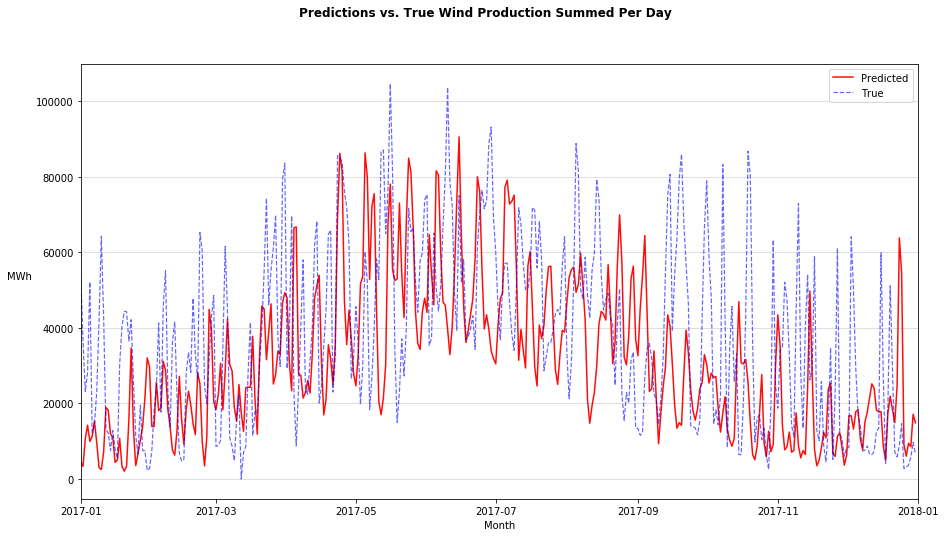

Test MAPE:  inf
Train R2:  0.5040643408712098
Test MAPE:  inf
Test R2:  -0.02892972091830104


C:\Users\graha\Anaconda3\lib\site-packages\ipykernel_launcher.py:44: RuntimeWarning:

divide by zero encountered in double_scalars

C:\Users\graha\Anaconda3\lib\site-packages\ipykernel_launcher.py:55: RuntimeWarning:

divide by zero encountered in double_scalars

C:\Users\graha\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:86: RuntimeWarning:

overflow encountered in reduce



In [49]:
yhatw = pd.DataFrame(forcastw.loc[((forcastw['ds'] >= pd.to_datetime('01/01/2017')) & (forcastw['ds'] < pd.to_datetime('01/01/2018'))),['yhat','ds']])
truew = pd.DataFrame(dd_w.loc[((dd_w['ds'] >= pd.to_datetime('01/01/2017')) & (dd_w['ds'] < pd.to_datetime('01/01/2018'))),['y','ds']])

testerw = pd.merge(yhatw.set_index(pd.DatetimeIndex(yhatw['ds'])),(truew.set_index(pd.DatetimeIndex(truew['ds']))),how='left',left_index=True,right_index=True)
display(testerw.head())

print('Predicted total wind Production 2017: ',(testerw['yhat'].sum())//1000)
print('True total wind Production 2017: ',testerw['y'].sum()//1000)
print('Error in year total prediction in GWh: ', (testerw['yhat'].sum()-testerw['y'].sum())//1000)


datafw = forcastw.loc[((forcastw['ds'] >= pd.to_datetime('01/01/2017')) & (forcastw['ds'] < pd.to_datetime('01/01/2018'))),:].set_index(pd.DatetimeIndex(forcastw.loc[((forcastw['ds'] >= pd.to_datetime('01/01/2017')) & (forcastw['ds'] < pd.to_datetime('01/01/2018'))),'ds'])).resample('24H').sum().loc[:,'yhat'].values
datatw = dd_w.loc[((dd_w['ds'] >= pd.to_datetime('01/01/2017')) & (dd_w['ds'] < pd.to_datetime('01/01/2018'))),:].\
set_index(pd.DatetimeIndex(dd_w.loc[((dd_w['ds'] >= pd.to_datetime('01/01/2017')) & (dd_w['ds'] < pd.to_datetime('01/01/2018'))),'ds'])).resample('24H').sum().loc[:,'y'].values
months = ['Jan','Feb','Mar','Apr','May','June','Jul','Aug','Sep','Oct','Nov','Dec']    


month_list = pd.date_range('01/01/2017','12/31/2017 23:00:00',freq='24H')


plt.figure(figsize=(15,8))
plt.plot(month_list,datafw,label='Predicted',linewidth=1.5,alpha=.95,color='r')
plt.plot(month_list,datatw,label='True',linewidth=1.2, alpha=.6,color='b',ls='--')
plt.legend()
plt.suptitle('Predictions vs. True Wind Production Summed Per Day',fontweight='bold')
plt.xlabel('Month')
plt.ylabel('MWh',rotation='0',ha='right')
plt.grid(axis='y',alpha=.5)
plt.xlim(pd.to_datetime('01/01/2017'),pd.to_datetime('01/01/2018'))
#plt.ylim(bottom=75000,top=260000)
plt.show()

yhat_trainw = pd.DataFrame(forcastw.loc[((forcastw['ds'] >= pd.to_datetime('01/01/2014')) & (forcastw['ds'] < pd.to_datetime('01/01/2017'))),['yhat','ds']])
true_trainw = pd.DataFrame(dd_w.loc[((dd_w['ds'] >= pd.to_datetime('01/01/2014')) & (dd_w['ds'] < pd.to_datetime('01/01/2017'))),['y','ds']])

tester_trainw = pd.merge(yhat_trainw.set_index(pd.DatetimeIndex(yhat_trainw['ds'])),(true_trainw.set_index(pd.DatetimeIndex(true_trainw['ds']))),how='left',left_index=True,right_index=True)


tester_trainw['msem'] = ((tester_trainw['y']-tester_trainw['yhat'])**2)
tester_trainw['mseb'] = (tester_trainw['y']-tester_trainw['y'].mean())**2
r2 = 1 - ((np.sum(tester_trainw['msem'])/len(tester_trainw))/(np.sum(tester_trainw['mseb'])/len(tester_trainw)))
true_trainw = tester_trainw['y'].values
yhat_trainw = tester_trainw['yhat'].values
mape = np.sum(list(map((lambda true,yhat : np.abs((true - yhat)/true)),true_trainw,yhat_trainw)))*(100/len(true_trainw))
print('Test MAPE: ', mape)
print('Train R2: ',r2)
    


testerw['msem'] = ((testerw['y']-testerw['yhat'])**2)
testerw['mseb'] = (testerw['y']-testerw['y'].mean())**2
r2 = 1 - ((np.sum(testerw['msem'])/len(testerw))/(np.sum(testerw['mseb'])/len(testerw)))
true_testw = testerw['y'].values
yhat_testw = testerw['yhat'].values
mape2 = (np.sum(np.nan_to_num(np.array(list(map((lambda true,yhat : (np.abs(true - yhat)/true)),true_testw,yhat_testw)))))*100)/len(true_testw)
print('Test MAPE: ', mape2)

print('Test R2: ',r2)
